In [1]:
import pandas as pd
import numpy as np
import prince
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import scale

import plotly.graph_objects as go
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
from sklearn.preprocessing import scale

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from matplotlib import colors

import setuptools
import sys
# On force l'alias : distutils pointera désormais vers setuptools
sys.modules['distutils'] = setuptools.distutils 

# Maintenant tu peux importer Yellowbrick
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [2]:
# Loaaaaaad the latest version
data_initial = pd.read_csv('data/spotify_songs.csv')

# Variables qualitives
qual_cols = data_initial.select_dtypes(include=['object']).columns
print('Variables qualitatives :', list(qual_cols))

categorical_cols = [
    "playlist_name", 
    "playlist_genre", 
    "playlist_subgenre",
    "mode",
    "key"
]

for col in categorical_cols:
    data_initial[col] = pd.Categorical(data_initial[col], ordered=False)

data_initial.describe()

# Variables quantatives
quant_cols = data_initial.select_dtypes(include=['float64', 'int64']).columns
print('Variables quantitatives :', list(quant_cols))

print(data_initial[categorical_cols].describe())

Variables qualitatives : ['track_id', 'track_name', 'track_artist', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre']
Variables quantitatives : ['track_popularity', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']
          playlist_name playlist_genre          playlist_subgenre   mode  \
count             32833          32833                      32833  32833   
unique              449              6                         24      2   
top     Indie Poptimism            edm  progressive electro house      1   
freq                308           6043                       1809  18574   

          key  
count   32833  
unique     12  
top         1  
freq     4010  


C:\Users\julie\AppData\Local\Temp\ipykernel_4436\1729703984.py:5: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  qual_cols = data_initial.select_dtypes(include=['object']).columns


In [3]:
# Remove dumb columns and uncomplete lines 

print('=== Non-meaningful columns ===')
# remove identifiers if they exist
cols = ["track_album_id", "playlist_id"]
print('Columns to drop:', cols)
data_initial.drop(columns=cols, errors='ignore', inplace=True)

print('')
print('=== Missing values ===')
print('Columns containing missing values are:', list(data_initial.columns[data_initial.isnull().sum()!=0]))

print('')
print('track_name - Rate of missing values: {:.2f}%'.format(data_initial['track_name'].isnull().sum()/data_initial.shape[0]*100))
print('track_artist - Rate of missing values: {:.2f}%'.format(data_initial['track_artist'].isnull().sum()/data_initial.shape[0]*100))
print('track_album_name - Rate of missing values: {:.2f}%'.format(data_initial['track_album_name'].isnull().sum()/data_initial.shape[0]*100))

print('We cannot put the average value or the most common value and the rate of missing values is very low, hence we will just delete the rows that have empty data.')

data = data_initial.dropna(subset=['track_name', 'track_artist', 'track_album_name'])

print('')
print('=== Checking ===')
print('Columns containing missing values are:', list(data.columns[data.isnull().sum()!=0]))

data_centered = data.copy()
data_centered[quant_cols] = scale(data[quant_cols])
print(data_centered.columns)

=== Non-meaningful columns ===
Columns to drop: ['track_album_id', 'playlist_id']

=== Missing values ===
Columns containing missing values are: ['track_name', 'track_artist', 'track_album_name']

track_name - Rate of missing values: 0.02%
track_artist - Rate of missing values: 0.02%
track_album_name - Rate of missing values: 0.02%
We cannot put the average value or the most common value and the rate of missing values is very low, hence we will just delete the rows that have empty data.

=== Checking ===
Columns containing missing values are: []
Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_name', 'track_album_release_date', 'playlist_name',
       'playlist_genre', 'playlist_subgenre', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms'],
      dtype='str')


In [4]:
## Remove data below 5th percentile and above 95th percentile
k=0.3
difference = data[quant_cols].quantile(0.95) - data[quant_cols].quantile(0.05)
lower_bounds = data[quant_cols].quantile(0.05) - k*difference
upper_bounds = data[quant_cols].quantile(0.95) + k*difference

mask = np.ones(len(data), dtype=bool)

for col in quant_cols:
    mask &= (data[col] >= lower_bounds[col]) & (data[col] <= upper_bounds[col])

df_clean = data_centered[mask]



In [5]:
print(len(data_centered))
print(len(df_clean))

print(df_clean.describe())
print(df_clean.columns)

32828
29827
       track_popularity  danceability        energy      loudness  \
count      29827.000000  29827.000000  29827.000000  29827.000000   
mean           0.017841      0.044136      0.054428      0.085707   
std            0.999743      0.957223      0.926407      0.872065   
min           -1.700696     -2.790348     -2.800254     -2.867391   
25%           -0.699899     -0.584814     -0.586484     -0.397334   
50%            0.140770      0.138877      0.151440      0.231724   
75%            0.821312      0.745399      0.787104      0.713556   
max            2.302491      2.247920      1.660452      2.196527   

        speechiness  acousticness  instrumentalness      liveness  \
count  29827.000000  29827.000000      29827.000000  29827.000000   
mean      -0.053689     -0.056537         -0.045433     -0.097879   
std        0.880919      0.909924          0.930818      0.785433   
min       -0.835627     -0.798349         -0.377985     -1.171761   
25%       -0.653011  

In [6]:
print(len(quant_cols))

11


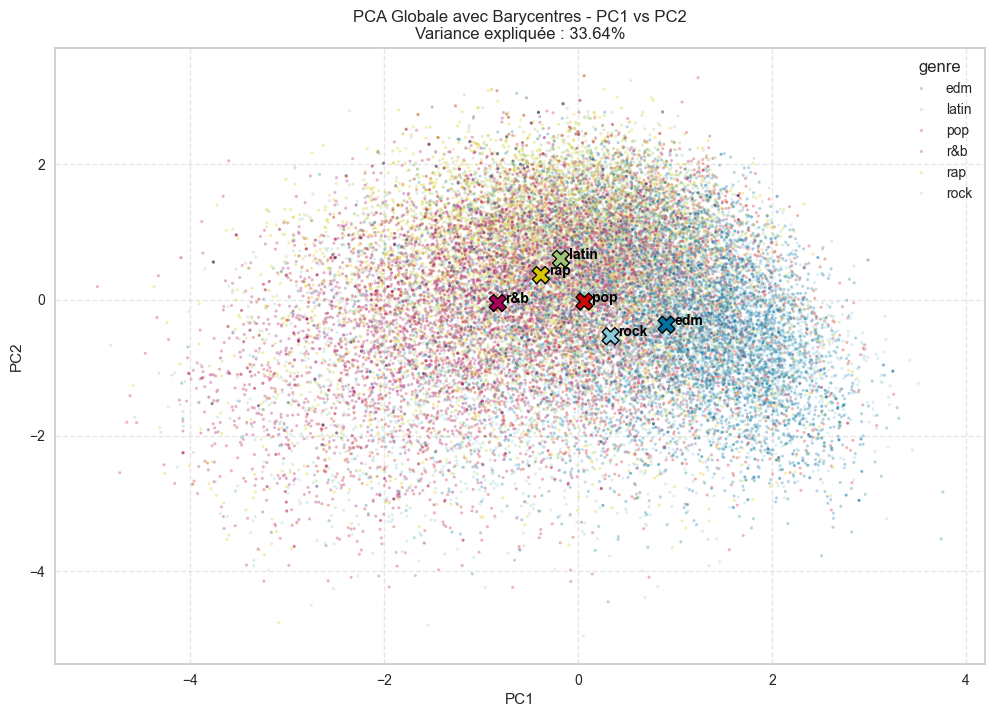

In [7]:
# 2. Calcul de la PCA (on en prévoit 5 pour avoir du choix)
pca_global = PCA(n_components=11)
coords_global = pca_global.fit_transform(df_clean[quant_cols])

# 3. Création du DataFrame
columns = [f'PC{i+1}' for i in range(11)]
df_clean_pca = pd.DataFrame(coords_global, columns=columns)
df_clean_pca['genre'] = df_clean['playlist_genre'].values


# --- TA CONFIGURATION ---
cp_x = 'PC1' 
cp_y = 'PC2' 
# -------------------------

# 1. Calcul des barycentres (moyenne par genre pour les CP choisies)
barycentres = df_clean_pca.groupby('genre')[[cp_x, cp_y]].mean().reset_index()

# 2. Visualisation
plt.figure(figsize=(12, 8))

# Affichage des points (individus)
sns.scatterplot(data=df_clean_pca, x=cp_x, y=cp_y, hue='genre', alpha=0.3, s=5, legend=True)

# Affichage des barycentres (plus gros, bordure noire pour ressortir)
sns.scatterplot(data=barycentres, x=cp_x, y=cp_y, hue='genre', 
                s=150, edgecolor='black', linewidth=1, legend=False, marker='X')

# Ajout des étiquettes de texte à côté des barycentres pour une lecture directe
for i in range(barycentres.shape[0]):
    plt.text(barycentres.loc[i, cp_x]+0.08, barycentres.loc[i, cp_y], 
             barycentres.loc[i, 'genre'], 
             weight='bold', size=10, color='black')
# Extraction des indices pour la variance (attention au cas où l'index > 9 avec int(cp_x[-1]))
idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1
var_x = pca_global.explained_variance_ratio_[idx_x]
var_y = pca_global.explained_variance_ratio_[idx_y]

plt.title(f"PCA Globale avec Barycentres - {cp_x} vs {cp_y}\nVariance expliquée : {var_x + var_y:.2%}")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

In [8]:
# Affichage simple des pourcentages par axe
for i, ratio in enumerate(pca_global.explained_variance_ratio_):
    print(f"PC{i+1} : {ratio:.2%}")


PC1 : 18.52%
PC2 : 15.12%
PC3 : 11.88%
PC4 : 9.62%
PC5 : 9.12%
PC6 : 8.70%
PC7 : 7.33%
PC8 : 6.61%
PC9 : 5.88%
PC10 : 5.04%
PC11 : 2.18%


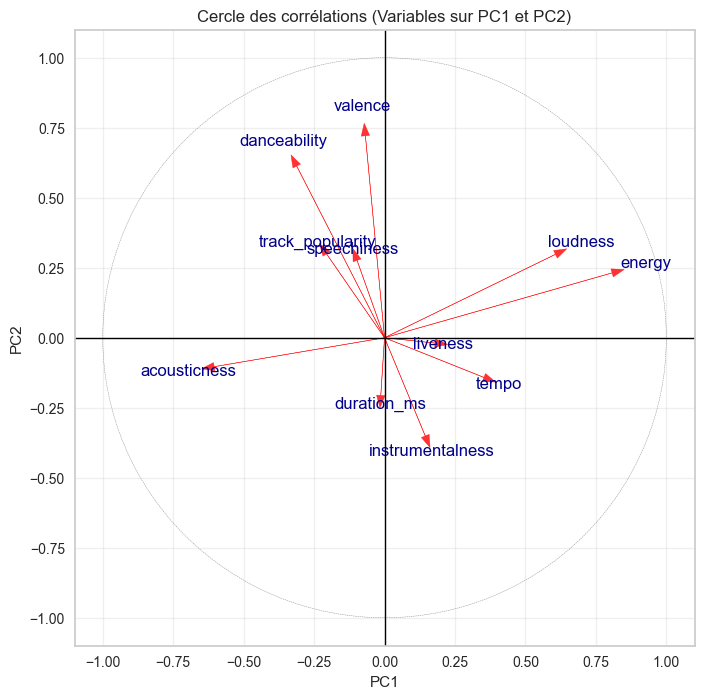

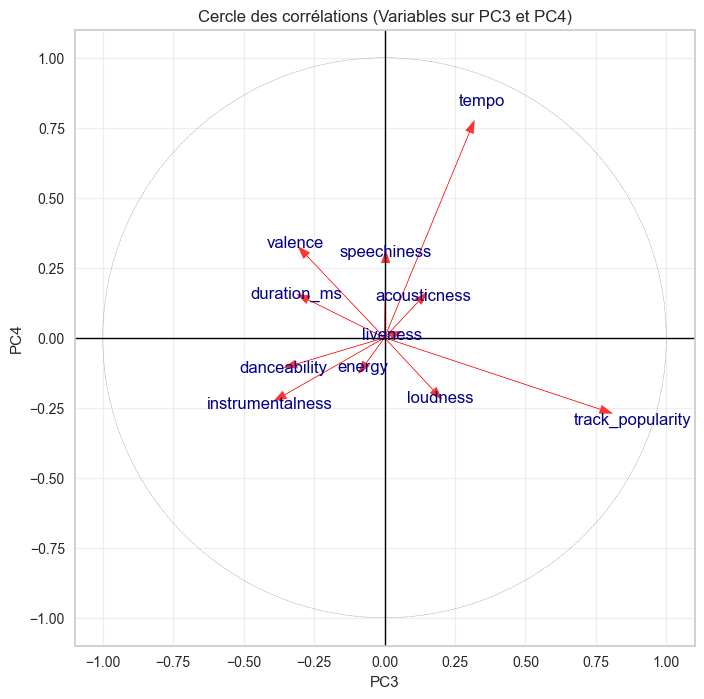

In [9]:
# --- CONFIGURATION : CHOISIS TES CP ICI ---
x_idx = 0  # 0 pour PC1
y_idx = 1  # 1 pour PC2 (change à 2 pour PC3, etc.)
# ------------------------------------------

# 1. Récupération des loadings (coordonnées des variables)
loadings = pca_global.components_.T * np.sqrt(pca_global.explained_variance_)

# 2. Création de la figure
plt.figure(figsize=(8, 8))
plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)

# 3. Dessiner les flèches pour chaque variable
for i, var_name in enumerate(quant_cols):
    plt.arrow(0, 0, loadings[i, x_idx], loadings[i, y_idx], 
              color='red', alpha=0.8, head_width=0.03)
    plt.text(loadings[i, x_idx]*1.15, loadings[i, y_idx]*1.15, 
             var_name, color='darkblue', ha='center', va='center')

# 4. Dessiner le cercle unité (optionnel mais recommandé)
cercle = plt.Circle((0,0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(cercle)



plt.xlabel(f'PC{x_idx+1}')
plt.ylabel(f'PC{y_idx+1}')
plt.title(f'Cercle des corrélations (Variables sur PC{x_idx+1} et PC{y_idx+1})')
plt.grid(True, alpha=0.3)
plt.xlim(-1.1, 1.1)
plt.ylim(-1.1, 1.1)
plt.show()

# --- CONFIGURATION : CHOISIS TES CP ICI ---
x_idx = 2  # 0 pour PC1
y_idx = 3  # 1 pour PC2 (change à 2 pour PC3, etc.)
# ------------------------------------------

# 1. Récupération des loadings (coordonnées des variables)
loadings = pca_global.components_.T * np.sqrt(pca_global.explained_variance_)

# 2. Création de la figure
plt.figure(figsize=(8, 8))
plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)

# 3. Dessiner les flèches pour chaque variable
for i, var_name in enumerate(quant_cols):
    plt.arrow(0, 0, loadings[i, x_idx], loadings[i, y_idx], 
              color='red', alpha=0.8, head_width=0.03)
    plt.text(loadings[i, x_idx]*1.15, loadings[i, y_idx]*1.15, 
             var_name, color='darkblue', ha='center', va='center')

# 4. Dessiner le cercle unité (optionnel mais recommandé)
cercle = plt.Circle((0,0), 1, color='gray', fill=False, linestyle='--')
plt.gca().add_artist(cercle)

plt.xlabel(f'PC{x_idx+1}')
plt.ylabel(f'PC{y_idx+1}')
plt.title(f'Cercle des corrélations (Variables sur PC{x_idx+1} et PC{y_idx+1})')
plt.grid(True, alpha=0.3)
plt.xlim(-1.1, 1.1)
plt.ylim(-1.1, 1.1)
plt.show()

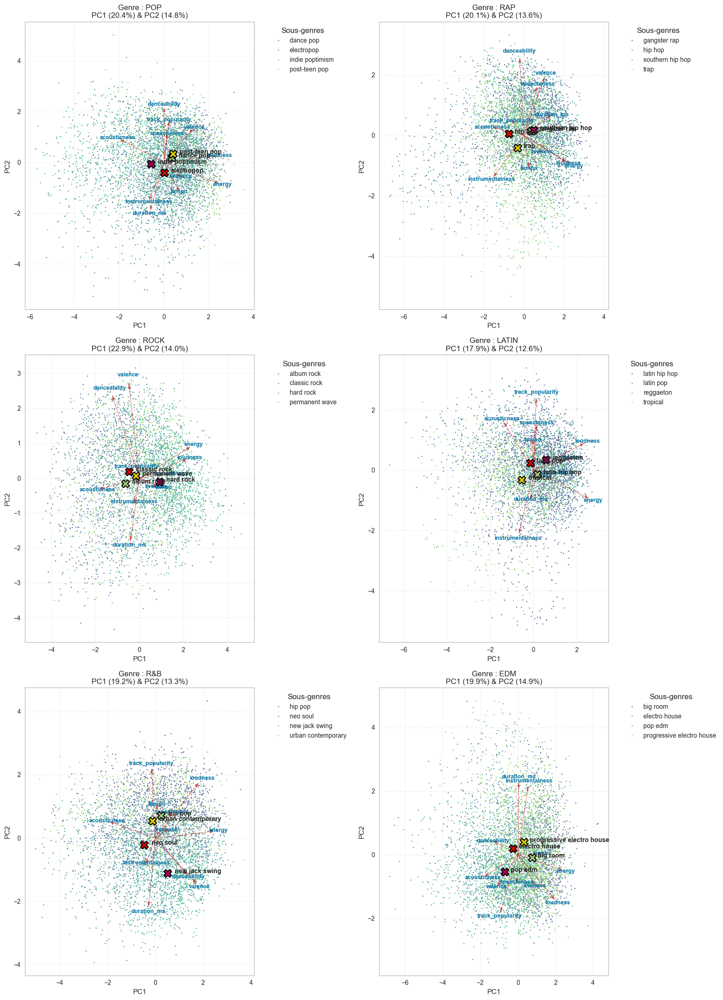

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

# --- CONFIGURATION : CHOISIS TES DIMENSIONS ICI ---
dim_x = 0  # 0 pour PC1, 1 pour PC2, 2 pour PC3, etc.
dim_y = 1  # 1 pour PC2, 2 pour PC3, 3 pour PC4, etc.
coeff = 4  # Facteur d'agrandissement des flèches pour qu'elles soient visibles
# --------------------------------------------------

genres_principaux = df_clean['playlist_genre'].unique()

fig, axes = plt.subplots(3, 2, figsize=(16, 22))
axes = axes.flatten()

for i, genre in enumerate(genres_principaux):
    # 1. Filtrer par genre
    sub_df = df_clean[df_clean['playlist_genre'] == genre].copy()
    
    # 2. Normalisation locale
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(sub_df[quant_cols])
    
    # 3. PCA
    n_comp = max(dim_x, dim_y) + 1
    pca_sub = PCA(n_components=n_comp)
    coords = pca_sub.fit_transform(x_scaled)
    
    # 4. Création du DataFrame de plotting
    label_x = f'PC{dim_x + 1}'
    label_y = f'PC{dim_y + 1}'
    plot_df = pd.DataFrame(coords[:, [dim_x, dim_y]], columns=[label_x, label_y])
    sub_df['playlist_subgenre'] = pd.Categorical(sub_df['playlist_subgenre']).remove_unused_categories()
    plot_df['sub_genre'] = sub_df['playlist_subgenre'].values
    
    # 5. Visualisation du nuage de points
    sns.scatterplot(data=plot_df, x=label_x, y=label_y, hue='sub_genre', 
                    ax=axes[i], alpha=1, s=3, palette='viridis')
    
    # --- AJOUT DES FLÈCHES (VARIABLES) ---
    # On récupère les coefficients des variables pour les deux axes choisis
    loadings = pca_sub.components_[[dim_x, dim_y], :].T
    
    for j, var in enumerate(quant_cols):
        # On trace la flèche en rouge
        axes[i].arrow(0, 0, loadings[j, 0] * coeff, loadings[j, 1] * coeff, 
                      color='r', alpha=0.7, head_width=0.1)
        # On écrit le nom de la variable
        axes[i].text(loadings[j, 0] * coeff * 1.15, loadings[j, 1] * coeff * 1.15, 
                     var, color='b', fontsize=9, ha='center', va='center', weight='bold')

    # 6. Calcul et affichage des Barycentres
    bary_sub = plot_df.groupby('sub_genre').mean().reset_index()
    offset_x = 0.3
    
    for _, row in bary_sub.iterrows():
        axes[i].scatter(row[label_x], row[label_y], marker='X', s=150, 
                        edgecolor='black', linewidth=1.5, zorder=10)
        axes[i].text(row[label_x] + offset_x, row[label_y], row['sub_genre'], 
                     weight='bold', fontsize=10, zorder=11)
        
    # Calcul de la variance
    var_x = pca_sub.explained_variance_ratio_[dim_x] * 100
    var_y = pca_sub.explained_variance_ratio_[dim_y] * 100
    
    axes[i].set_title(f"Genre : {genre.upper()}\n{label_x} ({var_x:.1f}%) & {label_y} ({var_y:.1f}%)")
    axes[i].grid(True, linestyle='--', alpha=0.3)
    axes[i].legend(title="Sous-genres", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [11]:
print(np.cumsum(pca_global.explained_variance_ratio_))
cols_to_keep = [f'PC{i+1}' for i in range(7)]
df_pca_clustering = df_clean_pca[cols_to_keep].copy()

[0.18522827 0.33643548 0.45521517 0.55141543 0.64262683 0.72958109
 0.80287364 0.86898239 0.92777878 0.97821549 1.        ]


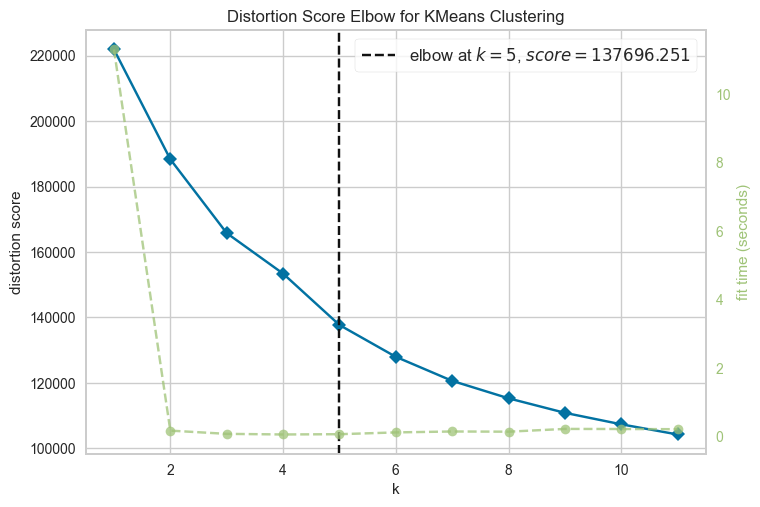

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [12]:
# Using yellowbrick

kmeans = KMeans(init='k-means++', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(1,12), force_model=True)

visualizer.fit(df_pca_clustering)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

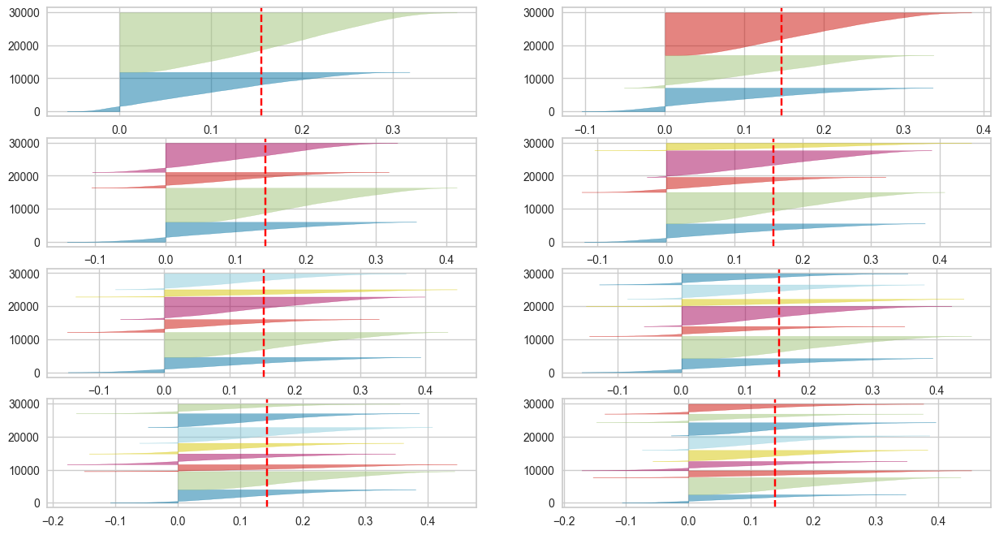

In [13]:
# %load solutions/kmeans/kmeans_silhouette.py
fig, ax = plt.subplots(4, 2, figsize=(15,8))

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init='auto', max_iter=100, random_state=42)
    q, mod = divmod(k, 2)
    
    # Create SilhouetteVisualizer instance with KMeans instance
    visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[q-1][mod], force_model=True)
    visualizer.fit(df_pca_clustering)

In [14]:
# %load solutions/kmeans/kmeans_2classes.py
K = 6

kmeans_pca = KMeans(n_clusters=K, init="k-means++", n_init="auto")
clusters_pca = kmeans_pca.fit_predict(df_pca_clustering)
df_clean_pca["clusters_pca"] = clusters_pca

# Affiche le nombre de morceaux par cluster
print("Taille de chaque cluster :")
print(df_clean_pca["clusters_pca"].value_counts().sort_index())


Taille de chaque cluster :
clusters_pca
0    4825
1    7552
2    4583
3    3868
4    6792
5    2207
Name: count, dtype: int64


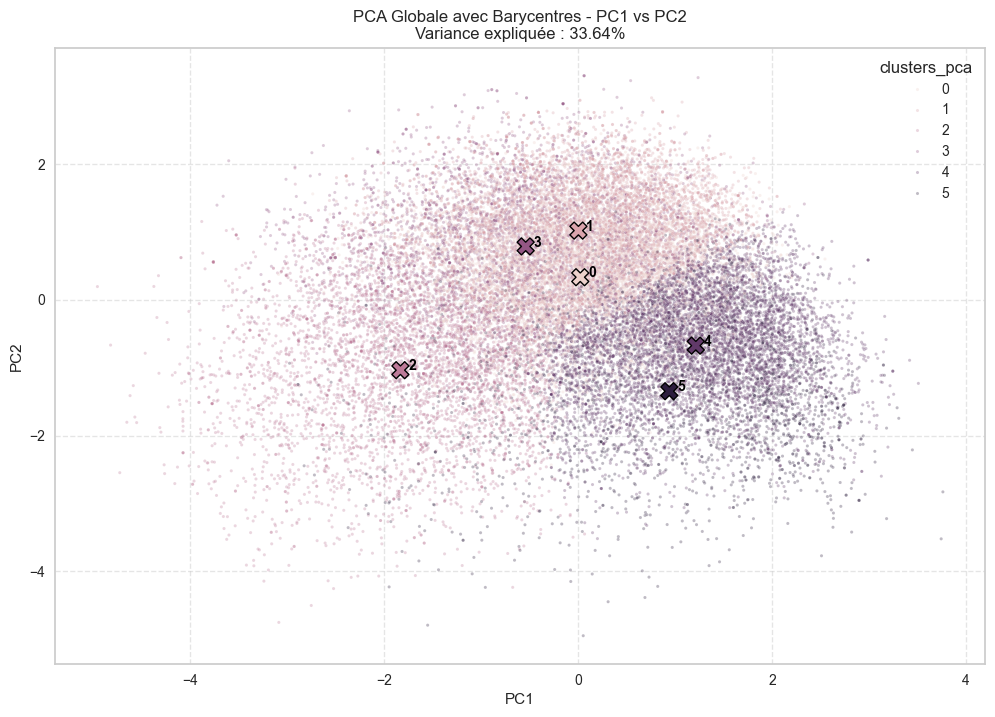

In [15]:

# --- TA CONFIGURATION ---
cp_x = 'PC1' 
cp_y = 'PC2' 
# -------------------------

# 1. Calcul des barycentres (moyenne par genre pour les CP choisies)
barycentres = df_clean_pca.groupby('clusters_pca')[[cp_x, cp_y]].mean().reset_index()

# 2. Visualisation
plt.figure(figsize=(12, 8))

# Affichage des points (individus)
sns.scatterplot(data=df_clean_pca, x=cp_x, y=cp_y, hue='clusters_pca', alpha=0.3, s=5, legend=True)

# Affichage des barycentres (plus gros, bordure noire pour ressortir)
sns.scatterplot(data=barycentres, x=cp_x, y=cp_y, hue='clusters_pca', 
                s=150, edgecolor='black', linewidth=1, legend=False, marker='X')

# Ajout des étiquettes de texte à côté des barycentres pour une lecture directe
for i in range(barycentres.shape[0]):
    plt.text(barycentres.loc[i, cp_x]+0.08, barycentres.loc[i, cp_y], 
             barycentres.loc[i, 'clusters_pca'], 
             weight='bold', size=10, color='black')
# Extraction des indices pour la variance (attention au cas où l'index > 9 avec int(cp_x[-1]))
idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1
var_x = pca_global.explained_variance_ratio_[idx_x]
var_y = pca_global.explained_variance_ratio_[idx_y]

plt.title(f"PCA Globale avec Barycentres - {cp_x} vs {cp_y}\nVariance expliquée : {var_x + var_y:.2%}")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

In [16]:
df_clean.columns

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_name', 'track_album_release_date', 'playlist_name',
       'playlist_genre', 'playlist_subgenre', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms'],
      dtype='str')

<Figure size 1200x800 with 0 Axes>

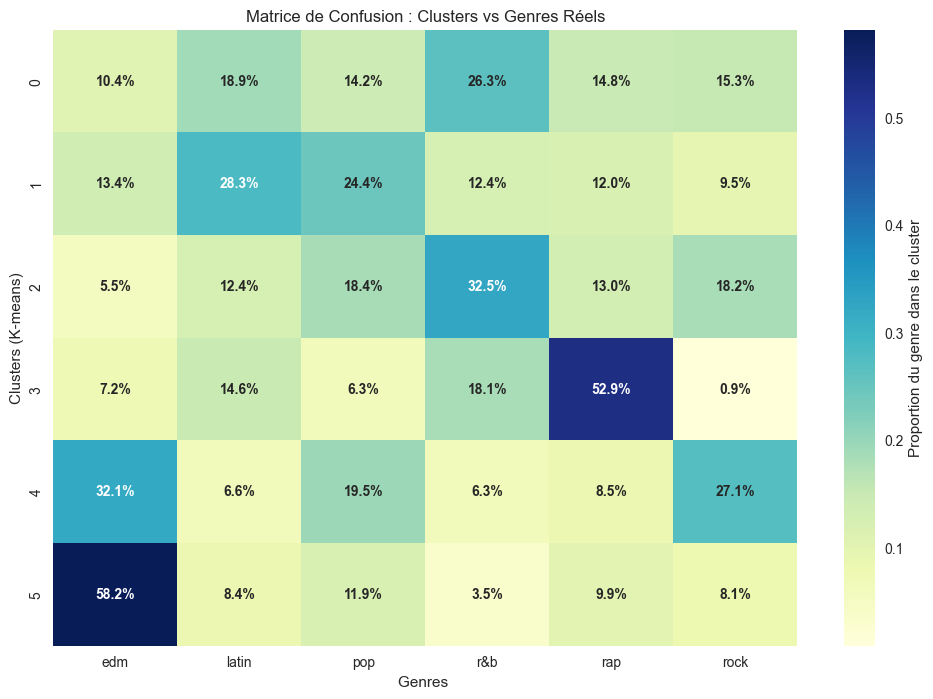

In [17]:
# 2. Normalisation par ligne (pour voir la répartition en % dans chaque cluster)
# Cela répond à la question : "Mon cluster 0 est composé de quel % de chaque genre ?"
contingency_pct = pd.crosstab(df_clean_pca["clusters_pca"], 
                                 df_clean_pca['genre'],
                              normalize='index')

# 3. Visualisation avec Heatmap
plt.figure(figsize=(12, 8))
annot_labels = (contingency_pct * 100).round(1).astype(str) + '%'

# 3. Affichage avec Heatmap
plt.figure(figsize=(12, 8))

sns.heatmap(
    contingency_pct, 
    annot=annot_labels, # On passe notre matrice de texte préparée
    fmt="",             # TRÈS IMPORTANT : fmt="" car on a déjà formaté le texte
    cmap="YlGnBu", 
    annot_kws={"size": 10, "weight": "bold"}, # On force la visibilité du texte
    cbar_kws={'label': 'Proportion du genre dans le cluster'}
)
plt.title("Matrice de Confusion : Clusters vs Genres Réels")
plt.xlabel("Genres ")
plt.ylabel("Clusters (K-means)")
plt.show()



In [18]:
print(df_clean.columns)
print(df_clean["playlist_genre"].unique())

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_name', 'track_album_release_date', 'playlist_name',
       'playlist_genre', 'playlist_subgenre', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms'],
      dtype='str')
['pop', 'rap', 'rock', 'latin', 'r&b', 'edm']
Categories (6, str): ['edm', 'latin', 'pop', 'r&b', 'rap', 'rock']


Clustering sur la MCA

In [19]:
# 1. On prépare le dataframe avec uniquement les colonnes quantitatives dans l'ordre de tes groupes
# 2. Définition des groupes pour la MFA
groups = {
    'G1_Power': ['loudness', 'energy', 'acousticness'],
    'G2_Vibe': ['danceability', 'valence'],
    'G3_SpeechPop': ['track_popularity', 'speechiness'],
    'G4_Duration': ['duration_ms'],
    'G5_TempoLive': ['liveness', 'tempo'],
    'G6_Instrum': ['instrumentalness']
}

# 3. Initialisation et Fit de la MFA
mfa = prince.MFA(
    n_components=11,
    n_iter=3,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
)
mfa = mfa.fit(df_clean[quant_cols], groups=groups)

# 4. Récupération des coordonnées des individus
df_clean_mfa = mfa.transform(df_clean[quant_cols])

df_clean_mfa.columns = [f'PC{i+1}' for i in range(11)]
df_clean_mfa['genre'] = df_clean['playlist_genre'].values


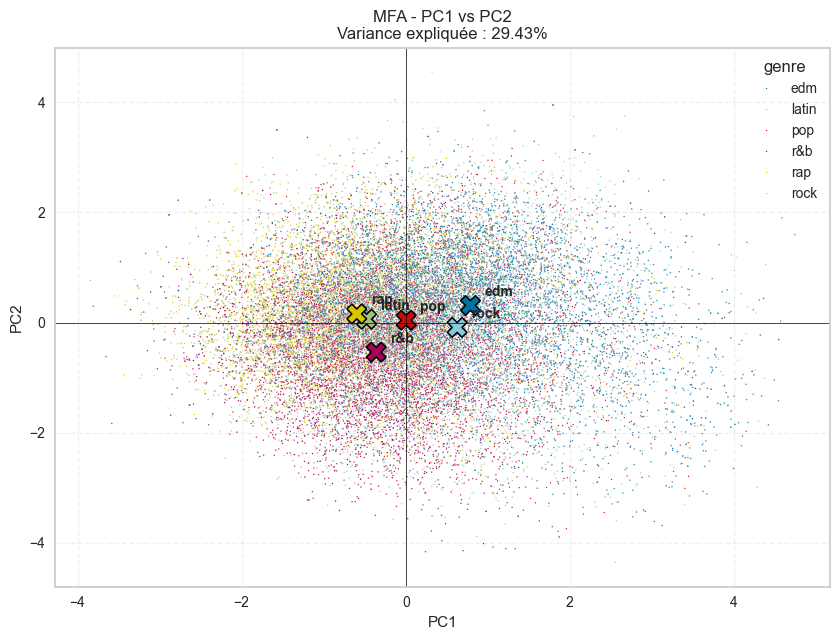

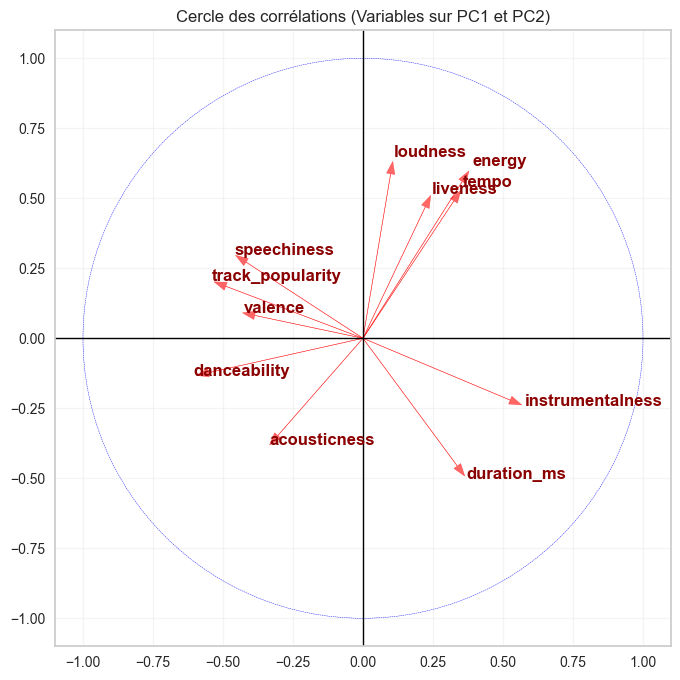

In [20]:
# --- CONFIGURATION ---
cp_x = 'PC1'
cp_y = 'PC2'
# ---------------------

plt.figure(figsize=(10, 7))

# 1. Nuage de points (Individus)
sns.scatterplot(data=df_clean_mfa, x=cp_x, y=cp_y, hue='genre', alpha=1, s=1)

# 2. Calcul des Barycentres
barycentres = df_clean_mfa.groupby('genre')[[cp_x, cp_y]].mean().reset_index()

# 3. Affichage des Barycentres (La Croix)
sns.scatterplot(data=barycentres, x=cp_x, y=cp_y, hue='genre', 
                s=200, edgecolor='black', marker='X', legend=False)

# 4. Ajout du texte décalé
offset = (df_clean_mfa[cp_x].max() - df_clean_mfa[cp_x].min()) * 0.02 # Offset dynamique
for i in range(len(barycentres)):
    plt.text(barycentres.loc[i, cp_x] + offset, 
             barycentres.loc[i, cp_y] + offset, 
             barycentres.loc[i, 'genre'], weight='bold', size=10)

# --- RÉCUPÉRATION DE LA VARIANCE (Correction de l'exception) ---
# On extrait le numéro de la PC (ex: 'PC1' -> 1) pour trouver le bon index (0)
# Extraction propre des indices (ex: 'PC1' -> 0)
idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1

eigenvalues = mfa.eigenvalues_
total_variance = sum(eigenvalues)

# Calcul du % de variance manuellement (plus sûr)
var_x = (eigenvalues[idx_x] / total_variance) * 100
var_y = (eigenvalues[idx_y] / total_variance) * 100

plt.title(f"MFA - {cp_x} vs {cp_y}\nVariance expliquée : {var_x + var_y:.2f}%")
plt.axhline(0, color='black', lw=0.5)
plt.axvline(0, color='black', lw=0.5)
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()


X=df_clean[quant_cols]
# --- CONFIGURATION DES AXES ---
idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1

# 1. Calcul des corrélations entre variables originales et axes MFA
# On utilise les colonnes dans l'ordre que tu as défini (cols_ordered)
correlations = X.corrwith(df_clean_mfa[f'PC{idx_x+1}']).to_frame(name='x')
correlations['y'] = X.corrwith(df_clean_mfa[f'PC{idx_y+1}'])

# 2. Tracé du graphe
plt.figure(figsize=(8, 8))
plt.axhline(0, color='black', lw=1)
plt.axvline(0, color='black', lw=1)

# 3. Dessiner les flèches
for i, var_name in enumerate(correlations.index):
    x_val = correlations.iloc[i, 0]
    y_val = correlations.iloc[i, 1]
    
    plt.arrow(0, 0, x_val, y_val, color='red', alpha=0.6, head_width=0.03)
    plt.text(x_val * 1.1, y_val * 1.1, var_name, color='darkred', weight='bold')

# 4. Forcer le cercle et le cadre -1 à 1
cercle = plt.Circle((0, 0), 1, color='blue', fill=False, linestyle='--')
plt.gca().add_artist(cercle)

plt.xlim(-1.1, 1.1)
plt.ylim(-1.1, 1.1)
plt.gca().set_aspect('equal')

plt.title(f"Cercle des corrélations (Variables sur {cp_x} et {cp_y})")
plt.grid(True, alpha=0.2)
plt.show()

In [21]:

print(np.cumsum(mfa.eigenvalues_/np.sum(mfa.eigenvalues_)))
cols_to_keep = [f'PC{i+1}' for i in range(7)]
df_mfa_clustering = df_clean_mfa[cols_to_keep].copy()

[0.15714282 0.29425939 0.41285911 0.52246971 0.6281774  0.7307735
 0.81731347 0.8962489  0.94666616 0.98556479 1.        ]


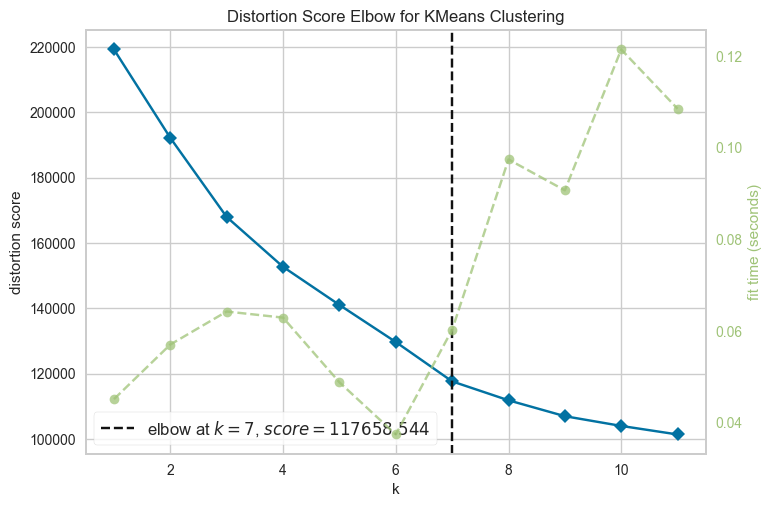

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [22]:
# Using yellowbrick

kmeans = KMeans(init='k-means++', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(1,12), force_model=True)

visualizer.fit(df_mfa_clustering)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

In [23]:
K=7
kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
df_clean_mfa['cluster'] = kmeans.fit_predict(df_mfa_clustering)

print(f"Répartition des morceaux :\n{df_clean_mfa['cluster'].value_counts()}")

Répartition des morceaux :
cluster
3    6845
0    4854
6    4422
2    3832
1    3797
4    3750
5    2327
Name: count, dtype: int64


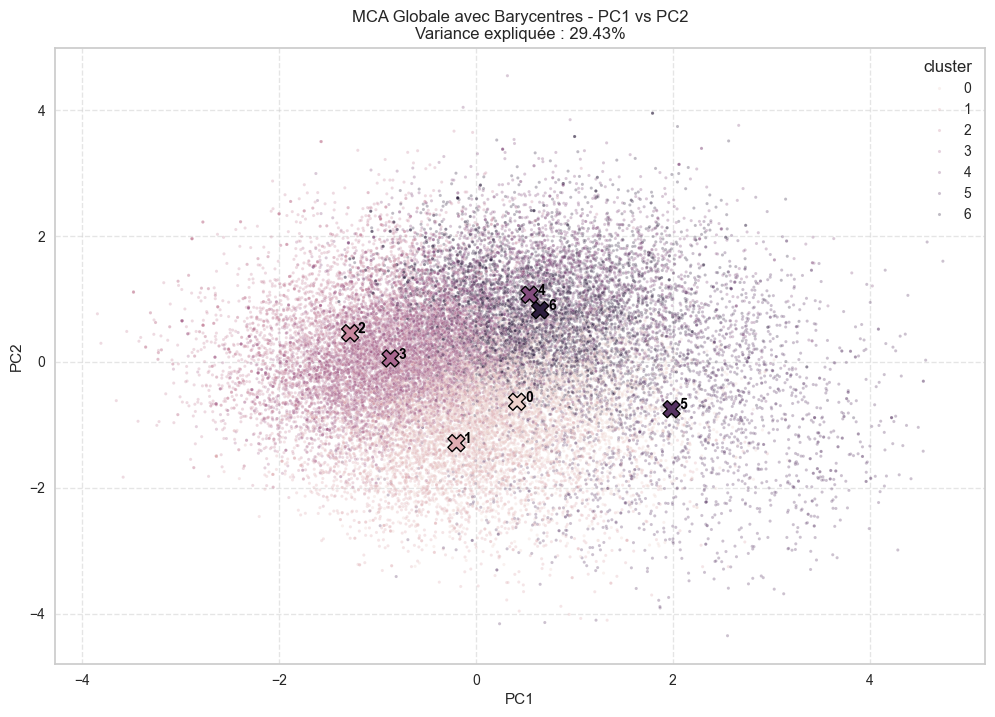

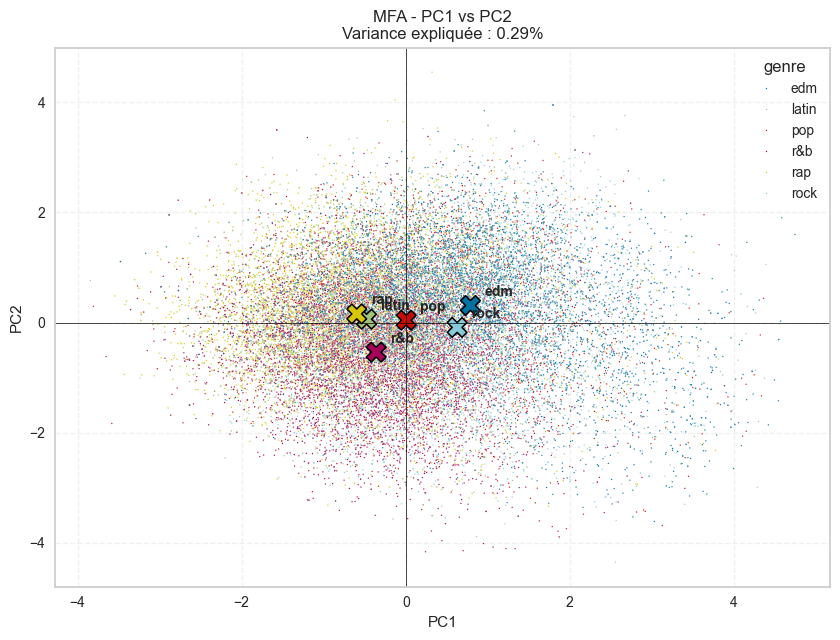

In [24]:

# --- TA CONFIGURATION ---
cp_x = 'PC1' 
cp_y = 'PC2' 
# -------------------------

# 1. Calcul des barycentres (moyenne par genre pour les CP choisies)
barycentres = df_clean_mfa.groupby('cluster')[[cp_x, cp_y]].mean().reset_index()

# 2. Visualisation
plt.figure(figsize=(12, 8))

# Affichage des points (individus)
sns.scatterplot(data=df_clean_mfa, x=cp_x, y=cp_y, hue='cluster', alpha=0.3, s=5, legend=True)

# Affichage des barycentres (plus gros, bordure noire pour ressortir)
sns.scatterplot(data=barycentres, x=cp_x, y=cp_y, hue='cluster', 
                s=150, edgecolor='black', linewidth=1, legend=False, marker='X')

# Ajout des étiquettes de texte à côté des barycentres pour une lecture directe
for i in range(barycentres.shape[0]):
    plt.text(barycentres.loc[i, cp_x]+0.08, barycentres.loc[i, cp_y], 
             barycentres.loc[i, 'cluster'], 
             weight='bold', size=10, color='black')
# Extraction des indices pour la variance (attention au cas où l'index > 9 avec int(cp_x[-1]))
idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1
var_x = mfa.eigenvalues_[idx_x]/np.sum(mfa.eigenvalues_)
var_y = mfa.eigenvalues_[idx_y]/np.sum(mfa.eigenvalues_)

plt.title(f"MCA Globale avec Barycentres - {cp_x} vs {cp_y}\nVariance expliquée : {var_x + var_y:.2%}")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

plt.figure(figsize=(10, 7))

# 1. Nuage de points (Individus)
sns.scatterplot(data=df_clean_mfa, x=cp_x, y=cp_y, hue='genre', alpha=1, s=1)

# 2. Calcul des Barycentres
barycentres = df_clean_mfa.groupby('genre')[[cp_x, cp_y]].mean().reset_index()

# 3. Affichage des Barycentres (La Croix)
sns.scatterplot(data=barycentres, x=cp_x, y=cp_y, hue='genre', 
                s=200, edgecolor='black', marker='X', legend=False)

# 4. Ajout du texte décalé
offset = (df_clean_mfa[cp_x].max() - df_clean_mfa[cp_x].min()) * 0.02 # Offset dynamique
for i in range(len(barycentres)):
    plt.text(barycentres.loc[i, cp_x] + offset, 
             barycentres.loc[i, cp_y] + offset, 
             barycentres.loc[i, 'genre'], weight='bold', size=10)

plt.title(f"MFA - {cp_x} vs {cp_y}\nVariance expliquée : {var_x + var_y:.2f}%")
plt.axhline(0, color='black', lw=0.5)
plt.axvline(0, color='black', lw=0.5)
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()

<Figure size 1200x800 with 0 Axes>

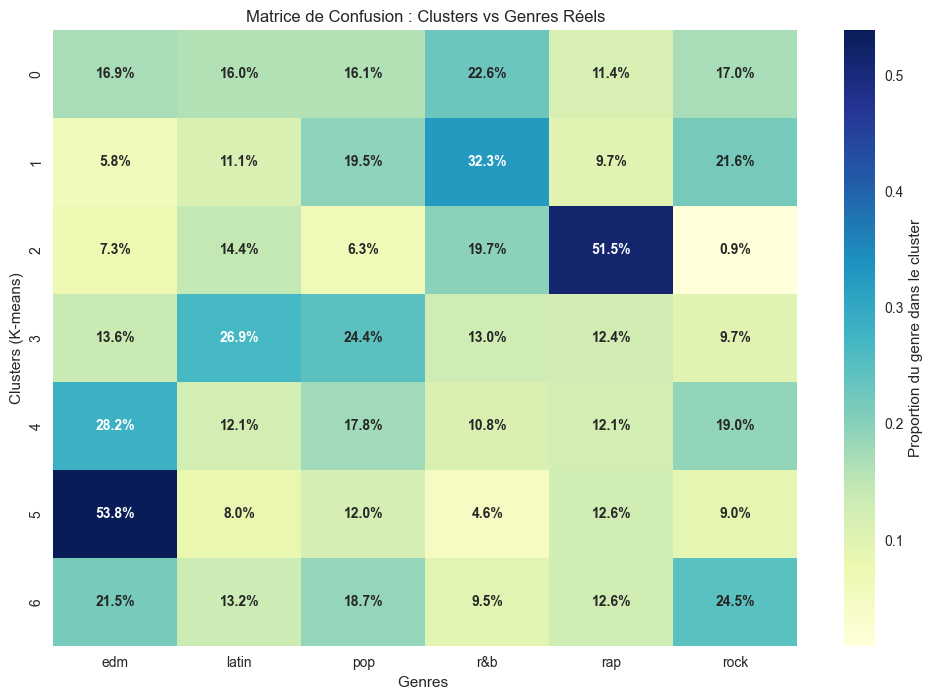

In [25]:
# 2. Normalisation par ligne (pour voir la répartition en % dans chaque cluster)
# Cela répond à la question : "Mon cluster 0 est composé de quel % de chaque genre ?"
contingency_pct = pd.crosstab(df_clean_mfa["cluster"], 
                                 df_clean_mfa['genre'],
                              normalize='index')

# 3. Visualisation avec Heatmap
plt.figure(figsize=(12, 8))
annot_labels = (contingency_pct * 100).round(1).astype(str) + '%'

# 3. Affichage avec Heatmap
plt.figure(figsize=(12, 8))

sns.heatmap(
    contingency_pct, 
    annot=annot_labels, # On passe notre matrice de texte préparée
    fmt="",             # TRÈS IMPORTANT : fmt="" car on a déjà formaté le texte
    cmap="YlGnBu", 
    annot_kws={"size": 10, "weight": "bold"}, # On force la visibilité du texte
    cbar_kws={'label': 'Proportion du genre dans le cluster'}
)
plt.title("Matrice de Confusion : Clusters vs Genres Réels")
plt.xlabel("Genres ")
plt.ylabel("Clusters (K-means)")
plt.show()



In [51]:
def mfa_generalisee(groups, Axe1=1,Axe2=2,Nb_kept_variables=7,K=6):
    cp_x= 'PC' + str(Axe1)
    cp_y= 'PC' + str(Axe2)

    #Réalisation de la mfa

    mfa = prince.MFA(
        n_components=11,
        n_iter=3,
        copy=True,
        check_input=True,
        engine='sklearn',
        random_state=42
    )
    mfa = mfa.fit(df_clean[quant_cols], groups=groups)

    # 4. Récupération des coordonnées des individus
    df_clean_mfa = mfa.transform(df_clean[quant_cols])

    df_clean_mfa.columns = [f'PC{i+1}' for i in range(11)]
    df_clean_mfa['genre'] = df_clean['playlist_genre'].values

    plt.figure(figsize=(10, 7))

    # 1. Nuage de points (Individus)
    sns.scatterplot(data=df_clean_mfa, x=cp_x, y=cp_y, hue='genre', alpha=1, s=1)

    # 2. Calcul des Barycentres
    barycentres = df_clean_mfa.groupby('genre')[[cp_x, cp_y]].mean().reset_index()

    # 3. Affichage des Barycentres (La Croix)
    sns.scatterplot(data=barycentres, x=cp_x, y=cp_y, hue='genre', 
                    s=200, edgecolor='black', marker='X', legend=False)

    # 4. Ajout du texte décalé
    offset = (df_clean_mfa[cp_x].max() - df_clean_mfa[cp_x].min()) * 0.02 # Offset dynamique
    for i in range(len(barycentres)):
        plt.text(barycentres.loc[i, cp_x] + offset, 
                barycentres.loc[i, cp_y] + offset, 
                barycentres.loc[i, 'genre'], weight='bold', size=10)

    # --- RÉCUPÉRATION DE LA VARIANCE (Correction de l'exception) ---
    # On extrait le numéro de la PC (ex: 'PC1' -> 1) pour trouver le bon index (0)
    # Extraction propre des indices (ex: 'PC1' -> 0)
    idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
    idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1

    eigenvalues = mfa.eigenvalues_
    total_variance = sum(eigenvalues)

    # Calcul du % de variance manuellement (plus sûr)
    var_x = (eigenvalues[idx_x] / total_variance) * 100
    var_y = (eigenvalues[idx_y] / total_variance) * 100

    plt.title(f"MFA - {cp_x} vs {cp_y}\nVariance expliquée : {var_x + var_y:.2f}%")
    plt.axhline(0, color='black', lw=0.5)
    plt.axvline(0, color='black', lw=0.5)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()


    X=df_clean[quant_cols]
    # --- CONFIGURATION DES AXES ---
    idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
    idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1

    # 1. Calcul des corrélations entre variables originales et axes MFA
    # On utilise les colonnes dans l'ordre que tu as défini (cols_ordered)
    correlations = X.corrwith(df_clean_mfa[f'PC{idx_x+1}']).to_frame(name='x')
    correlations['y'] = X.corrwith(df_clean_mfa[f'PC{idx_y+1}'])

    # 2. Tracé du graphe
    plt.figure(figsize=(8, 8))
    plt.axhline(0, color='black', lw=1)
    plt.axvline(0, color='black', lw=1)

    # 3. Dessiner les flèches
    for i, var_name in enumerate(correlations.index):
        x_val = correlations.iloc[i, 0]
        y_val = correlations.iloc[i, 1]
        
        plt.arrow(0, 0, x_val, y_val, color='red', alpha=0.6, head_width=0.03)
        plt.text(x_val * 1.1, y_val * 1.1, var_name, color='darkred', weight='bold')

    # 4. Forcer le cercle et le cadre -1 à 1
    cercle = plt.Circle((0, 0), 1, color='blue', fill=False, linestyle='--')
    plt.gca().add_artist(cercle)

    plt.xlim(-1.1, 1.1)
    plt.ylim(-1.1, 1.1)
    plt.gca().set_aspect('equal')

    plt.title(f"Cercle des corrélations (Variables sur {cp_x} et {cp_y})")
    plt.grid(True, alpha=0.2)
    plt.show()

    print("Variance cumulative : ")
    print(np.cumsum(mfa.eigenvalues_/np.sum(mfa.eigenvalues_)))
    cols_to_keep = [f'PC{i+1}' for i in range(Nb_kept_variables)]
    print(f"On en garde {Nb_kept_variables}")
    df_mfa_clustering = df_clean_mfa[cols_to_keep].copy()

    # Using yellowbrick

    kmeans = KMeans(init='k-means++', n_init='auto', max_iter=100, random_state=42)
    visualizer = KElbowVisualizer(kmeans, k=(1,12), force_model=True)

    visualizer.fit(df_mfa_clustering)    # Fit the data to the visualizer
    visualizer.show()    # Finalize and render the figure
    print(f"On a choisit de générer {K} clusters")
    kmeans = KMeans(n_clusters=K, random_state=42, n_init=10)
    df_clean_mfa['cluster'] = kmeans.fit_predict(df_mfa_clustering)

    print(f"Répartition des morceaux :\n{df_clean_mfa['cluster'].value_counts()}")


    # 1. Calcul des barycentres (moyenne par genre pour les CP choisies)
    barycentres = df_clean_mfa.groupby('cluster')[[cp_x, cp_y]].mean().reset_index()

    # 2. Visualisation
    plt.figure(figsize=(12, 8))

    # Affichage des points (individus)
    sns.scatterplot(data=df_clean_mfa, x=cp_x, y=cp_y, hue='cluster', alpha=0.3, s=5, legend=True)

    # Affichage des barycentres (plus gros, bordure noire pour ressortir)
    sns.scatterplot(data=barycentres, x=cp_x, y=cp_y, hue='cluster', 
                    s=150, edgecolor='black', linewidth=1, legend=False, marker='X')

    # Ajout des étiquettes de texte à côté des barycentres pour une lecture directe
    for i in range(barycentres.shape[0]):
        plt.text(barycentres.loc[i, cp_x]+0.08, barycentres.loc[i, cp_y], 
                barycentres.loc[i, 'cluster'], 
                weight='bold', size=10, color='black')
    # Extraction des indices pour la variance (attention au cas où l'index > 9 avec int(cp_x[-1]))
    idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
    idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1
    var_x = mfa.eigenvalues_[idx_x]/np.sum(mfa.eigenvalues_)
    var_y = mfa.eigenvalues_[idx_y]/np.sum(mfa.eigenvalues_)

    plt.title(f"MCA Globale avec Barycentres - {cp_x} vs {cp_y}\nVariance expliquée : {var_x + var_y:.2%}")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

    plt.figure(figsize=(10, 7))

    # 1. Nuage de points (Individus)
    sns.scatterplot(data=df_clean_mfa, x=cp_x, y=cp_y, hue='genre', alpha=1, s=1)

    # 2. Calcul des Barycentres
    barycentres = df_clean_mfa.groupby('genre')[[cp_x, cp_y]].mean().reset_index()

    # 3. Affichage des Barycentres (La Croix)
    sns.scatterplot(data=barycentres, x=cp_x, y=cp_y, hue='genre', 
                    s=200, edgecolor='black', marker='X', legend=False)

    # 4. Ajout du texte décalé
    offset = (df_clean_mfa[cp_x].max() - df_clean_mfa[cp_x].min()) * 0.02 # Offset dynamique
    for i in range(len(barycentres)):
        plt.text(barycentres.loc[i, cp_x] + offset, 
                barycentres.loc[i, cp_y] + offset, 
                barycentres.loc[i, 'genre'], weight='bold', size=10)

    plt.title(f"MFA - {cp_x} vs {cp_y}\nVariance expliquée : {var_x + var_y:.2f}%")
    plt.axhline(0, color='black', lw=0.5)
    plt.axvline(0, color='black', lw=0.5)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.show()

    # 2. Normalisation par ligne (pour voir la répartition en % dans chaque cluster)
    # Cela répond à la question : "Mon cluster 0 est composé de quel % de chaque genre ?"
    contingency_pct = pd.crosstab(df_clean_mfa["cluster"], 
                                    df_clean_mfa['genre'],
                                normalize='index')

    # 3. Visualisation avec Heatmap
    plt.figure(figsize=(12, 8))
    annot_labels = (contingency_pct * 100).round(1).astype(str) + '%'

    # 3. Affichage avec Heatmap
    plt.figure(figsize=(12, 8))

    sns.heatmap(
        contingency_pct, 
        annot=annot_labels, # On passe notre matrice de texte préparée
        fmt="",             # TRÈS IMPORTANT : fmt="" car on a déjà formaté le texte
        cmap="YlGnBu", 
        annot_kws={"size": 10, "weight": "bold"}, # On force la visibilité du texte
        cbar_kws={'label': 'Proportion du genre dans le cluster'}
    )
    plt.title("Matrice de Confusion : Clusters vs Genres Réels")
    plt.xlabel("Genres ")
    plt.ylabel("Clusters (K-means)")
    plt.show()

    contingency_pct = pd.crosstab(df_clean_mfa["cluster"], 
                                    df_clean_mfa['genre'],
                                normalize='columns')


    # 3. Visualisation avec Heatmap
    plt.figure(figsize=(12, 8))
    annot_labels = (contingency_pct * 100).round(1).astype(str) + '%'

    sns.heatmap(
        contingency_pct, 
        annot=annot_labels, # On passe notre matrice de texte préparée
        fmt="",             # TRÈS IMPORTANT : fmt="" car on a déjà formaté le texte
        cmap="YlGnBu", 
        annot_kws={"size": 10, "weight": "bold"}, # On force la visibilité du texte
        cbar_kws={'label': 'Proportion du genre dans le cluster'}
    )
    plt.title("Matrice de Confusion : Clusters vs Genres Réels")
    plt.xlabel("Genres ")
    plt.ylabel("Clusters (K-means)")
    plt.show()


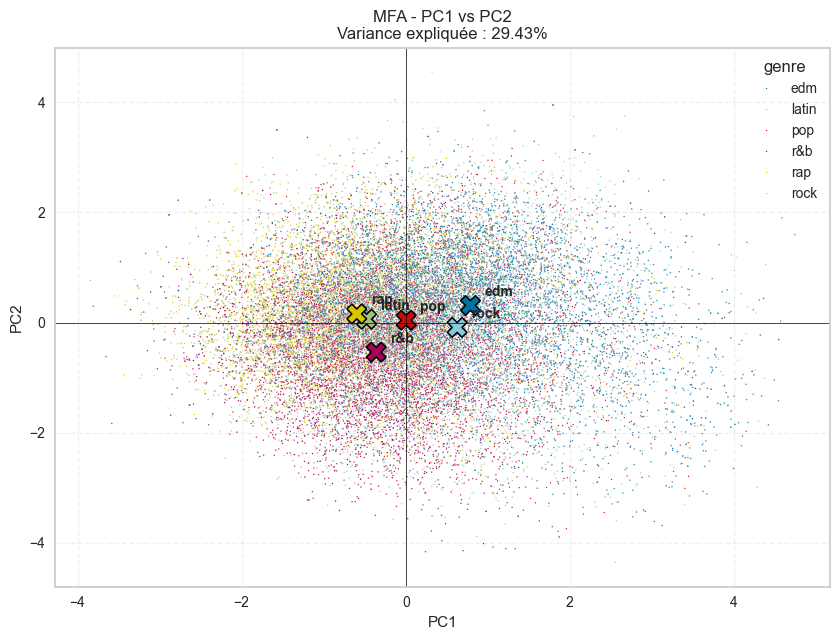

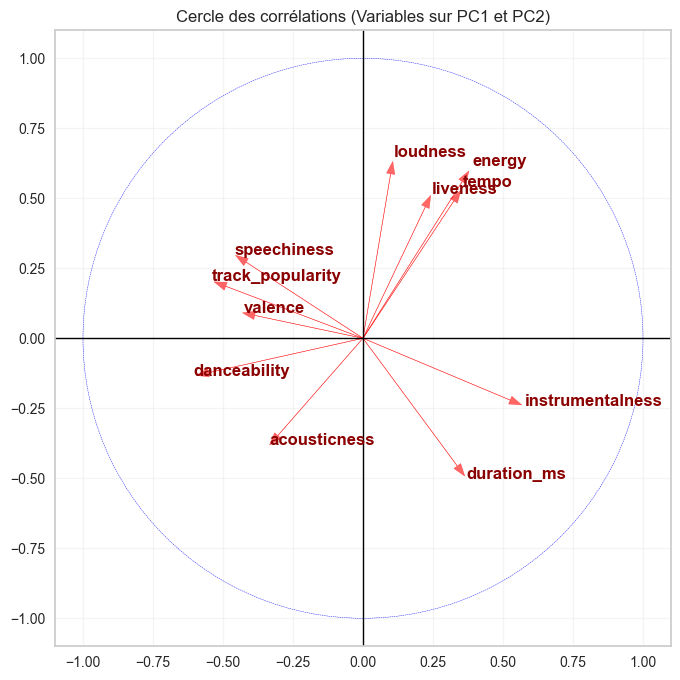

Variance cumulative : 
[0.15714282 0.29425939 0.41285911 0.52246971 0.6281774  0.7307735
 0.81731347 0.8962489  0.94666616 0.98556479 1.        ]
On en garde 7


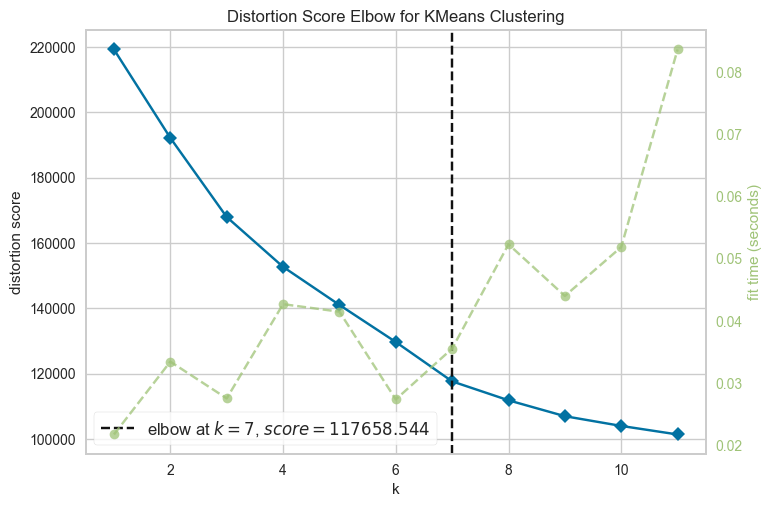

On a choisit de générer 7 clusters
Répartition des morceaux :
cluster
3    6845
0    4854
6    4422
2    3832
1    3797
4    3750
5    2327
Name: count, dtype: int64


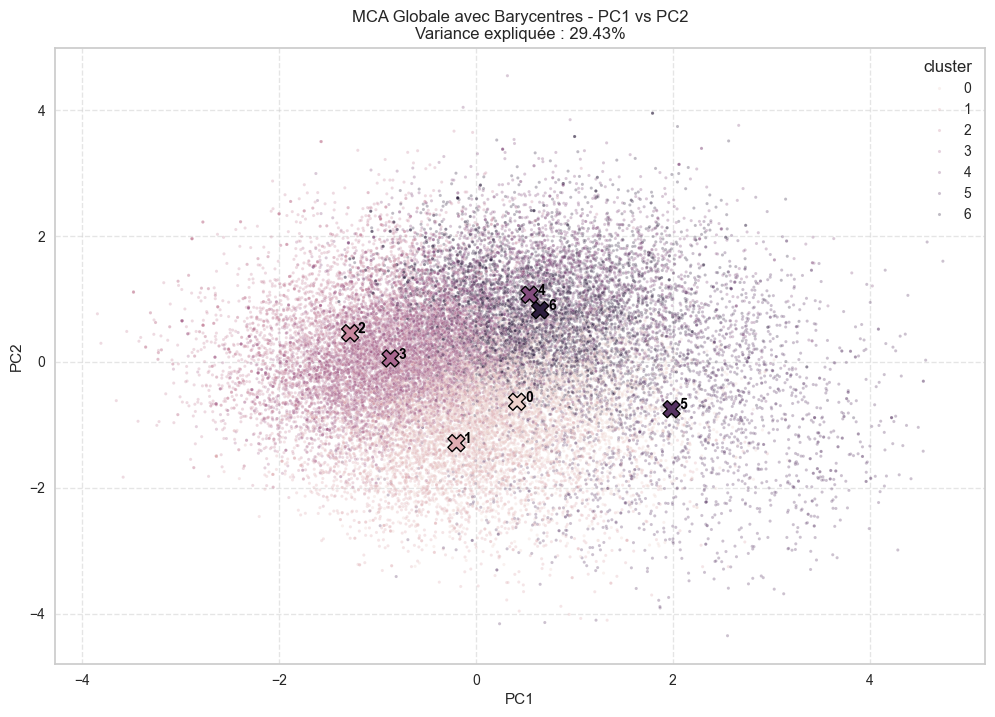

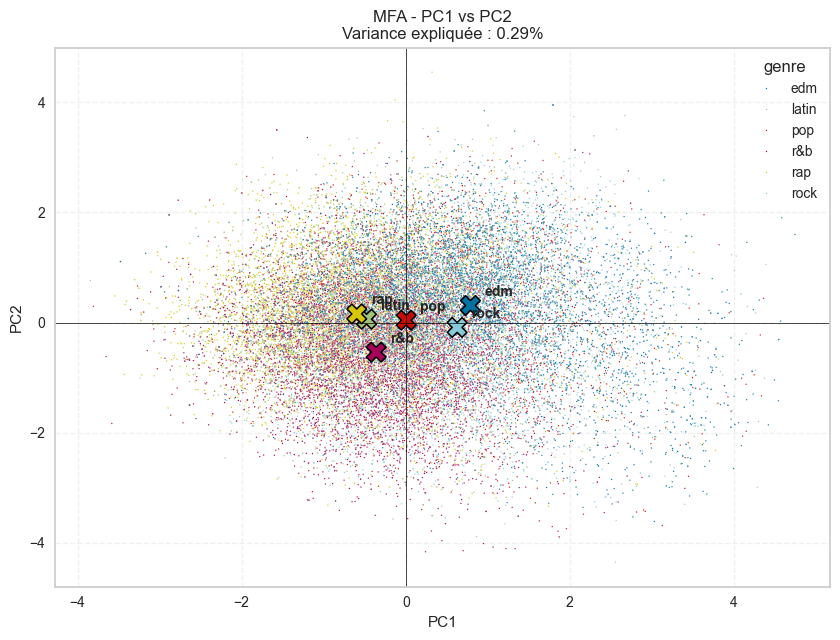

<Figure size 1200x800 with 0 Axes>

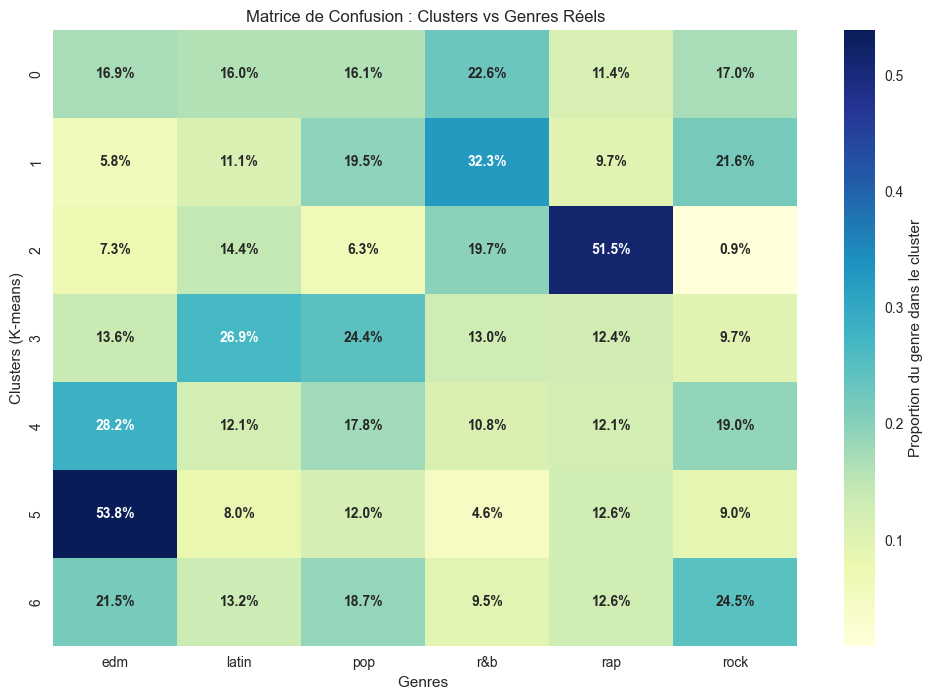

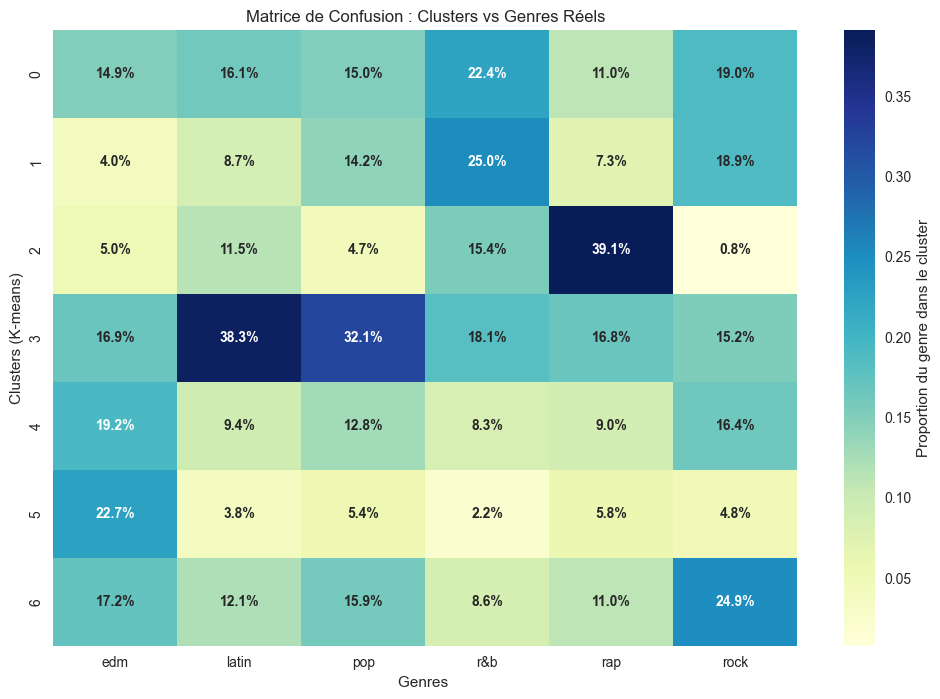

In [52]:
mfa_generalisee(groups = {
    'G1_Power': ['loudness', 'energy', 'acousticness'],
    'G2_Vibe': ['danceability', 'valence'],
    'G3_SpeechPop': ['track_popularity', 'speechiness'],
    'G4_Duration': ['duration_ms'],
    'G5_TempoLive': ['liveness', 'tempo'],
    'G6_Instrum': ['instrumentalness']
},K=7)

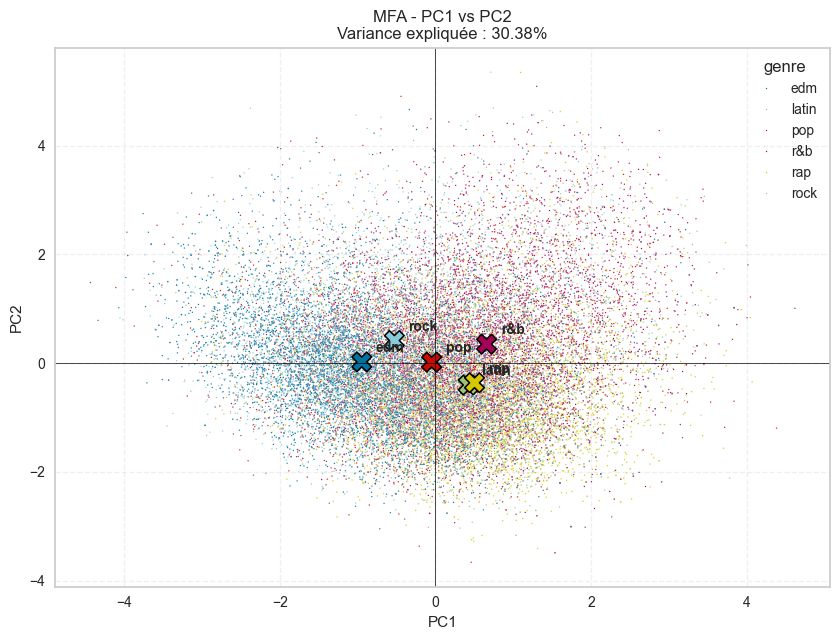

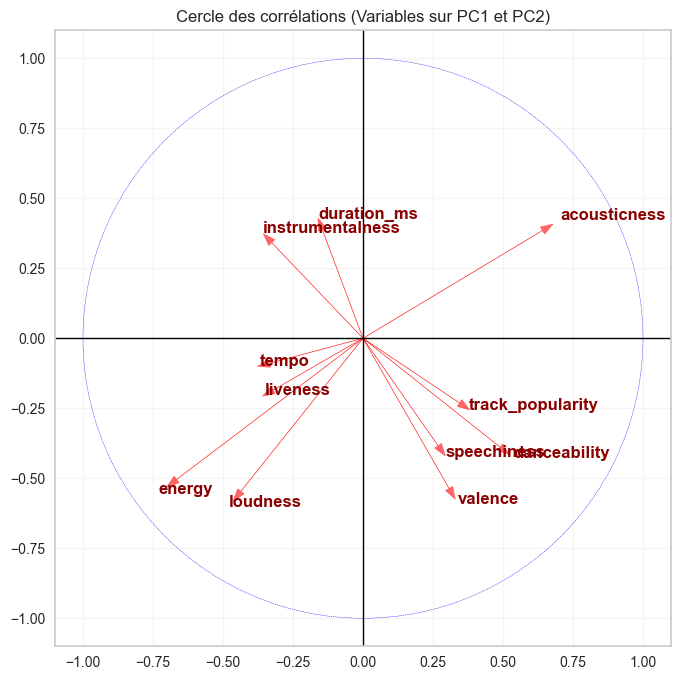

Variance cumulative : 
[0.16153919 0.30380966 0.42058432 0.52501501 0.6249168  0.71656766
 0.79852335 0.87761091 0.93560808 0.98391473 1.        ]
On en garde 7


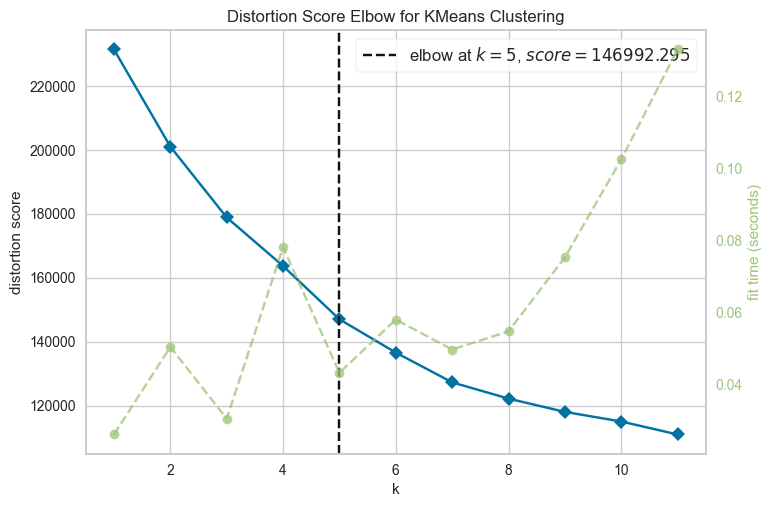

On a choisit de générer 6 clusters
Répartition des morceaux :
cluster
0    8690
3    6295
4    4333
5    4237
2    4087
1    2185
Name: count, dtype: int64


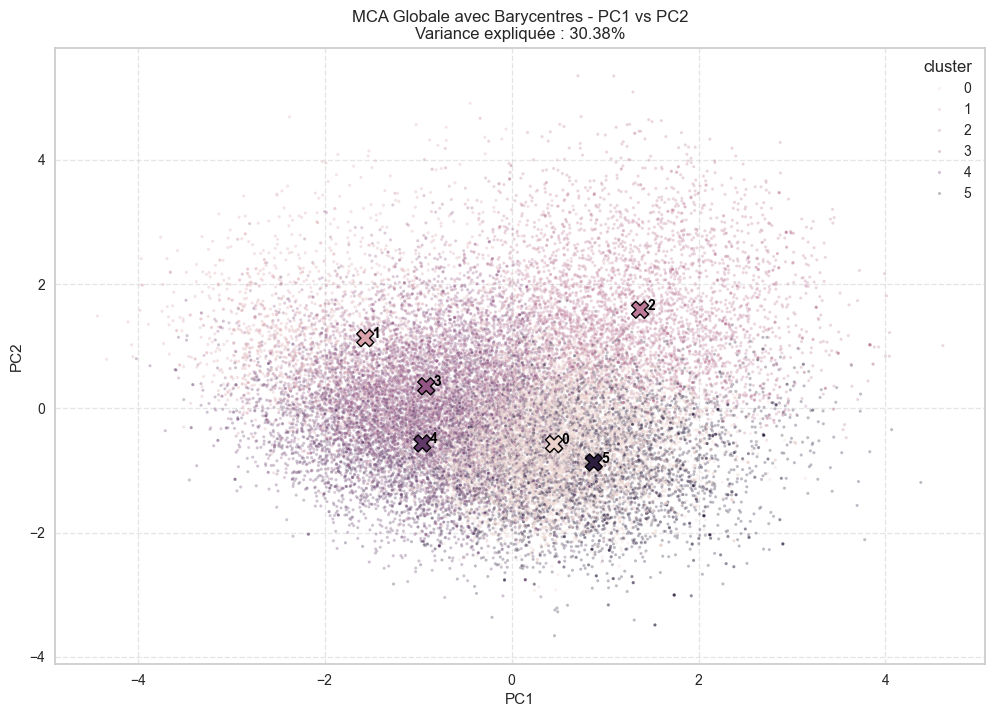

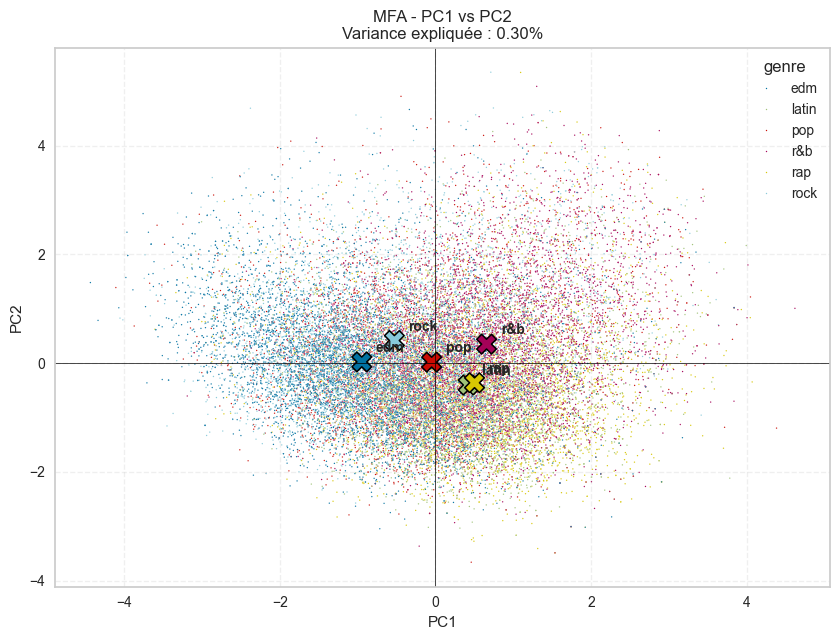

<Figure size 1200x800 with 0 Axes>

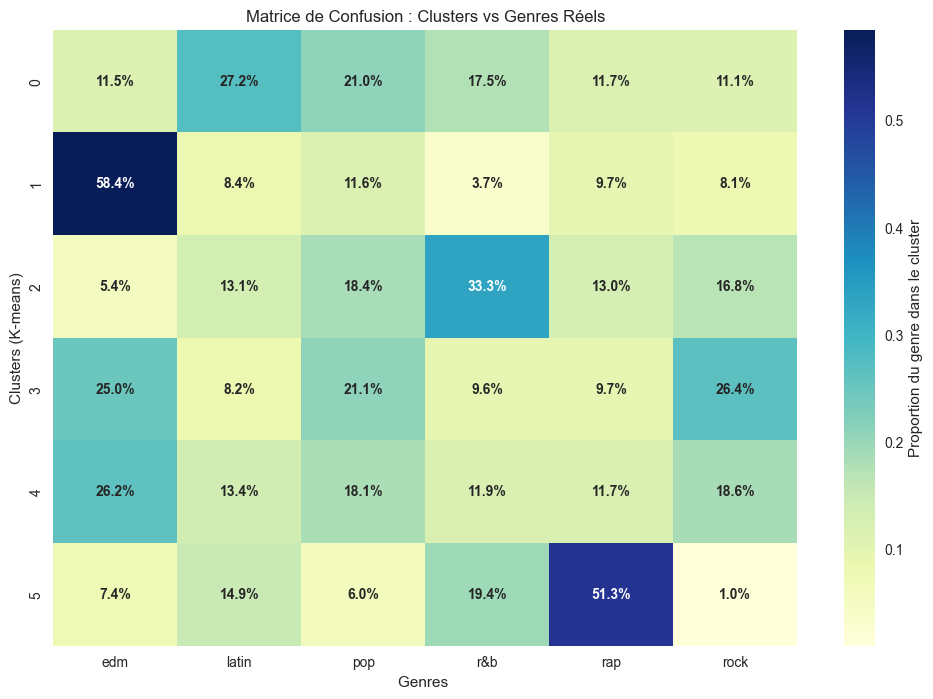

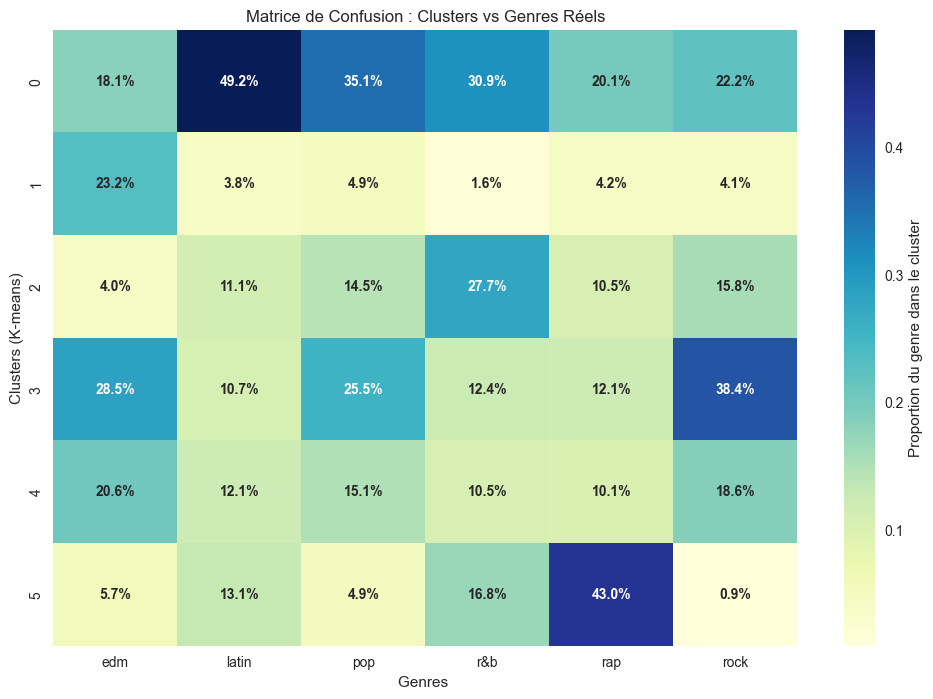

In [53]:
groups_technique = {
    'G1_Acoustics': ['acousticness', 'instrumentalness'],
    'G2_Dynamics': ['loudness', 'energy'],
    'G3_Rhythm': ['danceability', 'tempo'],
    'G4_Vocal': ['speechiness', 'track_popularity'],
    'G5_Atmosphere': ['valence', 'liveness'],
    'G6_Time': ['duration_ms']
}

mfa_generalisee(groups = groups_technique)

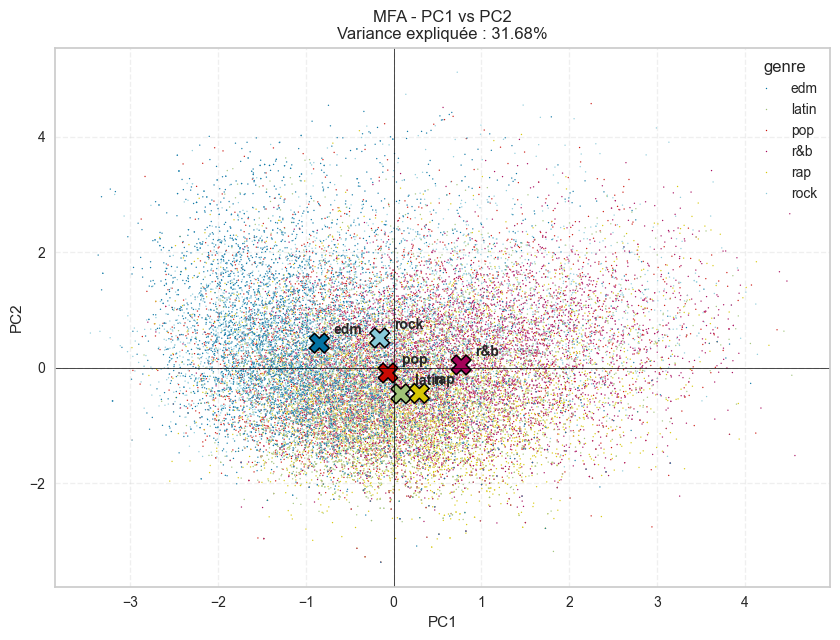

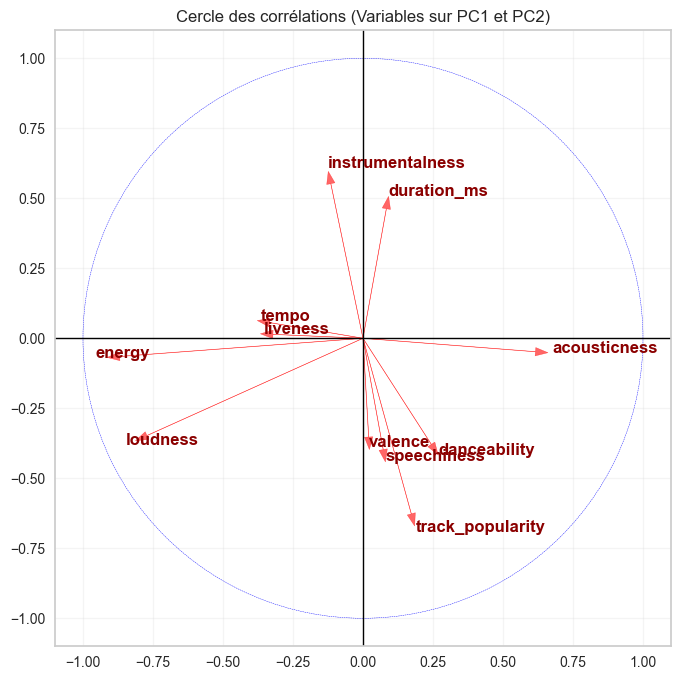

Variance cumulative : 
[0.17314584 0.31682158 0.42920275 0.53166598 0.62871157 0.72290932
 0.80420216 0.87992839 0.93541398 0.98047282 1.        ]
On en garde 7


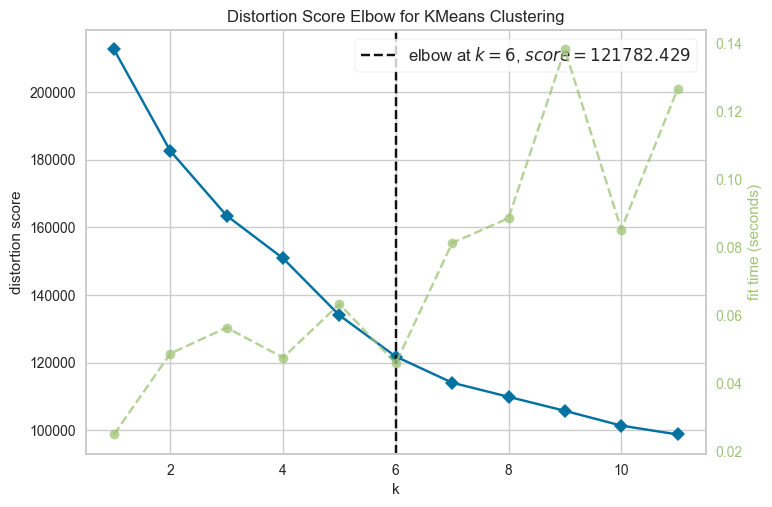

On a choisit de générer 6 clusters
Répartition des morceaux :
cluster
3    8793
1    5638
0    4977
2    4089
5    4048
4    2282
Name: count, dtype: int64


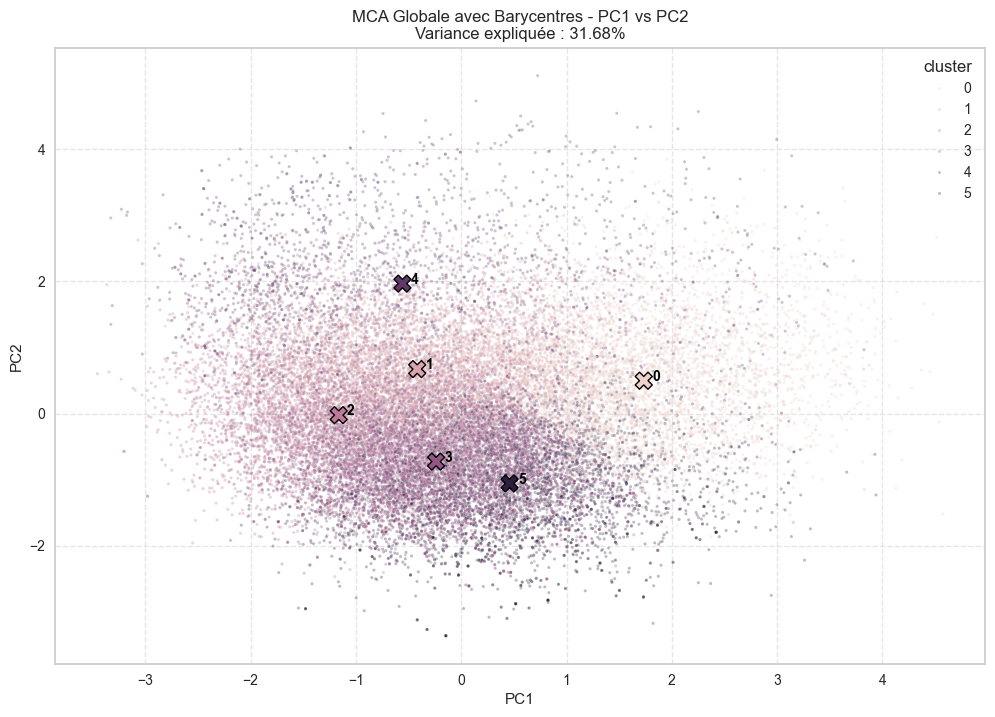

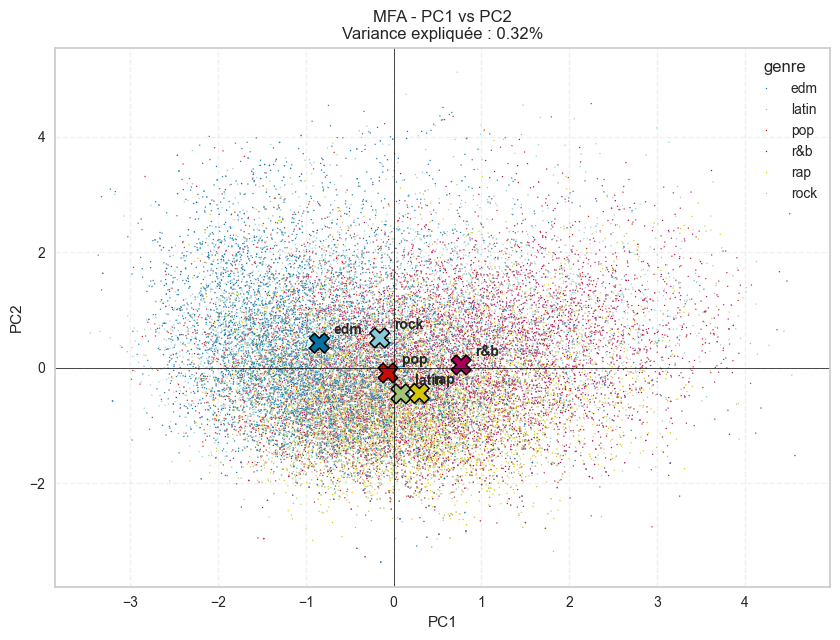

<Figure size 1200x800 with 0 Axes>

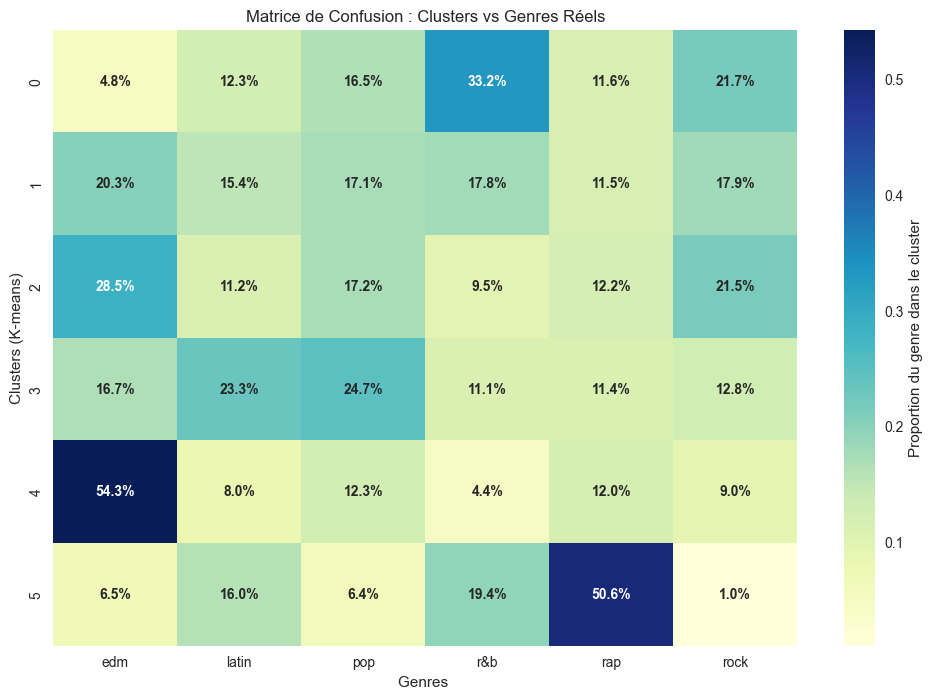

In [29]:
groups_marketing = {
    'G1_Success': ['track_popularity'],
    'G2_Structure': ['duration_ms', 'tempo', 'loudness'],
    'G3_Performance': ['liveness', 'instrumentalness', 'speechiness'],
    'G4_Vibe_Energy': ['energy', 'danceability', 'valence', 'acousticness']
}

mfa_generalisee(groups=groups_marketing)

import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# 2. Génération du lien (Linkage) avec la méthode de Ward
Z = linkage(df_mfa_clustering, method='ward')

# 3. Affichage du Dendrogramme (pour voir la structure globale)
plt.figure(figsize=(12, 7))
dendrogram(Z, truncate_mode='lastp', p=30, leaf_rotation=90, leaf_font_size=10)
plt.title("Dendrogramme du Clustering Hiérarchique (MFA)")
plt.xlabel("Index des échantillons (ou taille des groupes)")
plt.ylabel("Distance de Ward")
plt.axhline(y=150, color='r', linestyle='--') # Ligne de coupe imaginaire
plt.show()



# 4. Application du clustering pour obtenir 6 groupes
cah = AgglomerativeClustering(n_clusters=6, linkage='ward')
df_clean_mfa['cluster_cah'] = cah.fit_predict(df_mfa_clustering)

# 1. Création de la table de contingence
# Assure-toi que df_clean['playlist_genre'] contient tes 6 genres
contingency_cah = pd.crosstab(df_clean_mfa['cluster_cah'], 
                              df_clean['playlist_genre'], 
                              normalize='index')

# 2. Préparation des étiquettes textuelles (%)
annot_labels = (contingency_cah * 100).round(1).astype(str) + '%'

print(f"Répartition des morceaux :\n{df_clean_mfa['cluster_cah'].value_counts()}")


# 3. Affichage de la Heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    contingency_cah, 
    annot=annot_labels, 
    fmt="", 
    cmap="YlOrRd", # Changement de couleur pour différencier du K-means
    cbar_kws={'label': 'Proportion du genre dans le cluster'}
)

plt.title("Matrice de Confusion : Genres vs Clustering Hiérarchique (Ward)", fontsize=14)
plt.xlabel("Genres Réels")
plt.ylabel("Clusters CAH (0-5)")
plt.show()

contingency = pd.crosstab( df_clean_mfa['cluster_cah'], 
                              df_clean['playlist_genre'], normalize='columns')
annot_labels = (contingency * 100).round(1).astype(str) + '%'

plt.figure(figsize=(12, 8))
sns.heatmap(contingency, annot=annot_labels, fmt="", cmap="YlGnBu")
plt.title("Matrice de Confusion (Méthode df_boost : Inversion + PCA)")
plt.xlabel("Genres Réels")
plt.ylabel("Clusters (0-5)")
plt.show()

Index(['track_popularity', 'danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'inv_danceability', 'inv_energy', 'inv_valence'],
      dtype='str')
Répartition des morceaux :
cluster
0    10294
3     8516
1     6353
4     4602
2       62
Name: count, dtype: int64


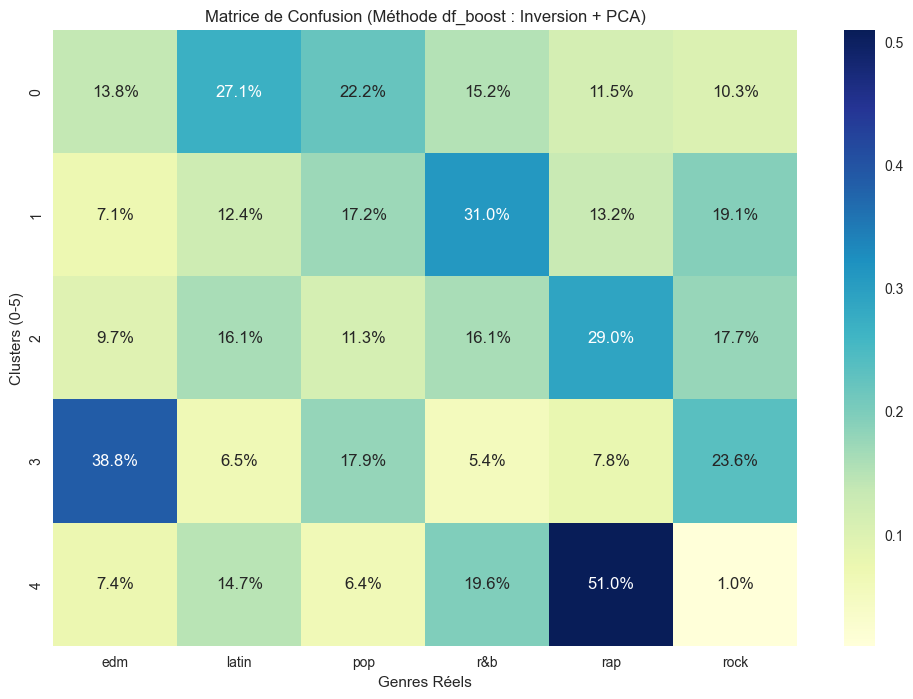

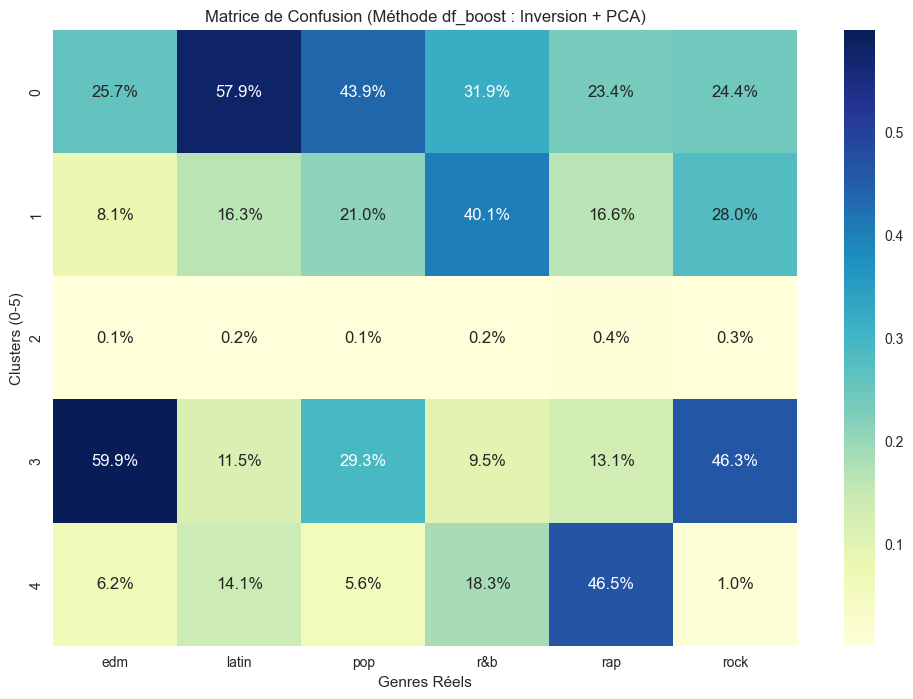

In [38]:
# 1. Création de df_boost avec les variables inversées (ton idée)
df_boost = df_clean.select_dtypes(include=[np.number]).copy()

# On applique l'inverse pour étirer le "centre" (Rock/Pop)
cols_to_invert = ['danceability', 'energy', 'valence']
for col in cols_to_invert:
    df_boost[f'inv_{col}'] = 1 / (df_boost[col] + 0.01)

# 2. Scaling DIRECT dans df_boost
scaler = StandardScaler()
# On remplace les valeurs par leur version scalée (Fit & Transform)
df_boost[df_boost.columns] = scaler.fit_transform(df_boost)
print(df_boost.columns)
# 3. PCA directement sur df_boost
pca = PCA(n_components=0.80, random_state=42)
pca_coords = pca.fit_transform(df_boost)

# 4. K-means (K=6) sur les composantes PCA
kmeans = KMeans(n_clusters=5, n_init=10, random_state=42)
df_boost['cluster'] = kmeans.fit_predict(pca_coords)
print(f"Répartition des morceaux :\n{df_boost['cluster'].value_counts()}")


# 5. Matrice de Confusion (Comparaison avec les genres réels)
# On récupère les genres du dataframe d'origine
df_boost['genre_reel'] = df_clean['playlist_genre'].values

contingency = pd.crosstab(df_boost['cluster'], df_boost['genre_reel'], normalize='index')
annot_labels = (contingency * 100).round(1).astype(str) + '%'

plt.figure(figsize=(12, 8))
sns.heatmap(contingency, annot=annot_labels, fmt="", cmap="YlGnBu")
plt.title("Matrice de Confusion (Méthode df_boost : Inversion + PCA)")
plt.xlabel("Genres Réels")
plt.ylabel("Clusters (0-5)")
plt.show()


contingency = pd.crosstab(df_boost['cluster'], df_boost['genre_reel'], normalize='columns')
annot_labels = (contingency * 100).round(1).astype(str) + '%'

plt.figure(figsize=(12, 8))
sns.heatmap(contingency, annot=annot_labels, fmt="", cmap="YlGnBu")
plt.title("Matrice de Confusion (Méthode df_boost : Inversion + PCA)")
plt.xlabel("Genres Réels")
plt.ylabel("Clusters (0-5)")
plt.show()

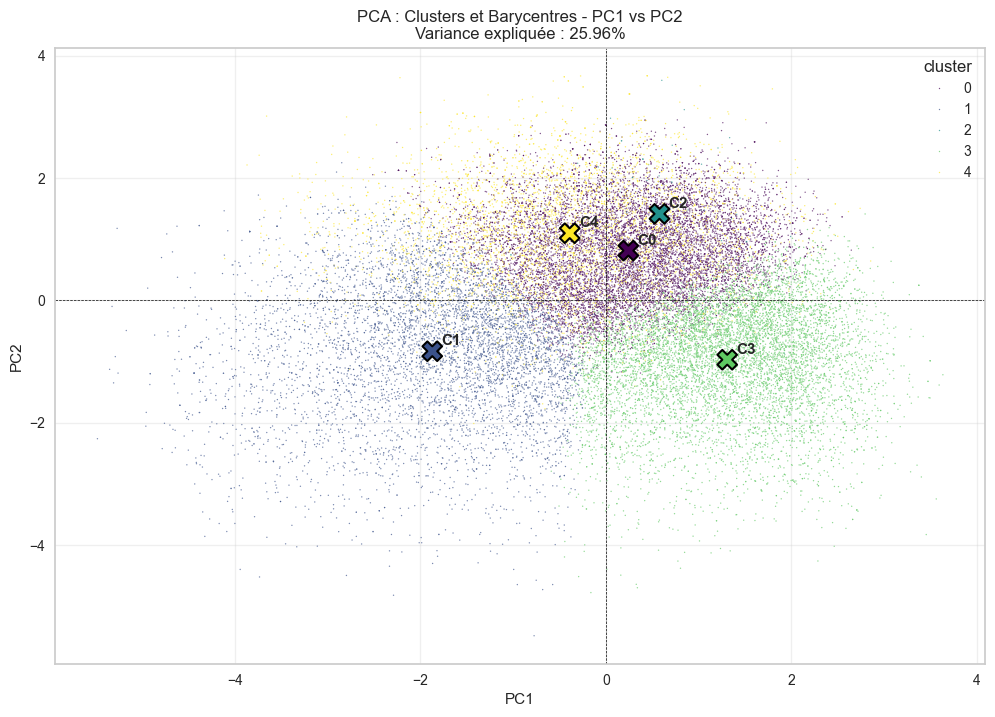

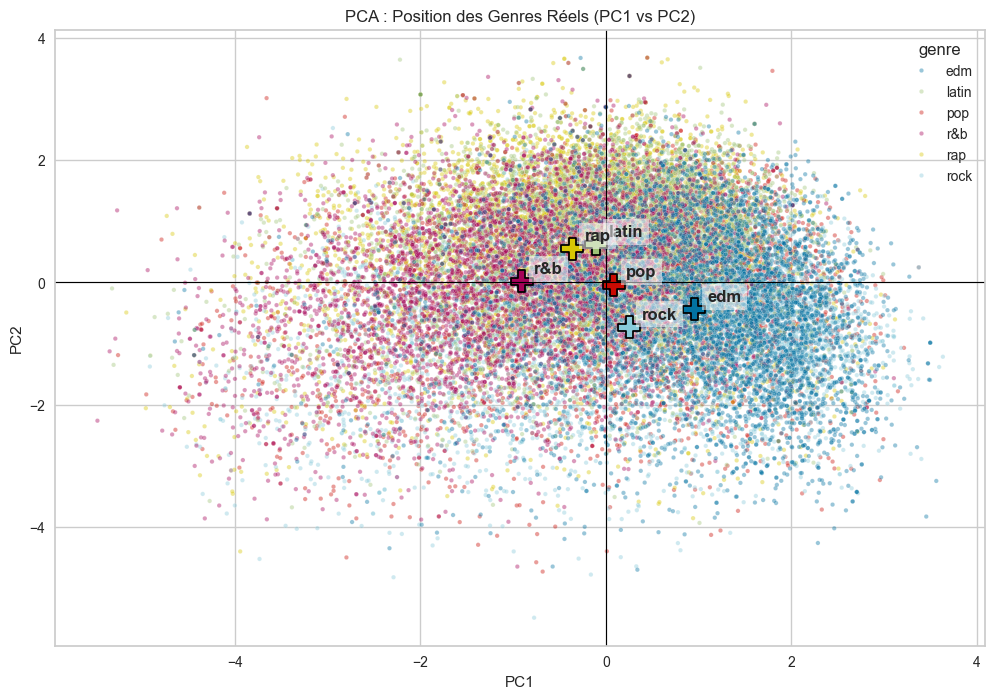

In [35]:

# --- CONFIGURATION DES AXES ---
cp_x = 'PC1' 
cp_y = 'PC2' 

# Préparation des données : on crée un DF temporaire avec les coordonnées PCA
# On part du principe que pca_coords contient tes résultats PCA
df_plot = pd.DataFrame(pca_coords, columns=[f'PC{i+1}' for i in range(pca_coords.shape[1])])
df_plot['cluster'] = df_boost['cluster'].values
df_plot['genre'] = df_boost['genre_reel'].values

# 1. Calcul des barycentres par CLUSTER
bary_clusters = df_plot.groupby('cluster')[[cp_x, cp_y]].mean().reset_index()

plt.figure(figsize=(12, 8))

# Affichage des points (individus)
sns.scatterplot(data=df_plot, x=cp_x, y=cp_y, hue='cluster', palette='viridis', alpha=0.7, s=1)

# Affichage des barycentres (Croix noires)
sns.scatterplot(data=bary_clusters, x=cp_x, y=cp_y, hue='cluster', palette='viridis',
                s=200, edgecolor='black', linewidth=1.5, legend=False, marker='X')

# Labels des barycentres
for i in range(len(bary_clusters)):
    plt.text(bary_clusters.loc[i, cp_x] + 0.1, bary_clusters.loc[i, cp_y] + 0.1, 
             f"C{bary_clusters.loc[i, 'cluster']}", weight='bold', size=11)

# Variance expliquée
idx_x = int(''.join(filter(str.isdigit, cp_x))) - 1
idx_y = int(''.join(filter(str.isdigit, cp_y))) - 1
var_expl = (pca.explained_variance_ratio_[idx_x] + pca.explained_variance_ratio_[idx_y]) * 100

plt.title(f"PCA : Clusters et Barycentres - {cp_x} vs {cp_y}\nVariance expliquée : {var_expl:.2f}%")
plt.axhline(0, color='black', lw=0.5, ls='--')
plt.axvline(0, color='black', lw=0.5, ls='--')
plt.grid(True, alpha=0.3)
plt.show()

plt.figure(figsize=(12, 8))

# 1. Nuage de points par Genre
sns.scatterplot(data=df_plot, x=cp_x, y=cp_y, hue='genre', alpha=0.4, s=10)

# 2. Calcul des Barycentres par GENRE
bary_genres = df_plot.groupby('genre')[[cp_x, cp_y]].mean().reset_index()

# 3. Affichage des Barycentres
sns.scatterplot(data=bary_genres, x=cp_x, y=cp_y, hue='genre', 
                s=250, edgecolor='black', marker='P', legend=False) # 'P' pour un gros plus

# Labels des genres
offset = (df_plot[cp_x].max() - df_plot[cp_x].min()) * 0.015
for i in range(len(bary_genres)):
    plt.text(bary_genres.loc[i, cp_x] + offset, bary_genres.loc[i, cp_y] + offset, 
             bary_genres.loc[i, 'genre'], weight='bold', size=12, 
             bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

plt.title(f"PCA : Position des Genres Réels ({cp_x} vs {cp_y})")
plt.axhline(0, color='black', lw=0.8)
plt.axvline(0, color='black', lw=0.8)
plt.show()

Index(['track_popularity', 'danceability', 'energy', 'loudness', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'ind_rock_power', 'ind_latin_groove', 'inv_dance',
       'inv_energy'],
      dtype='str')


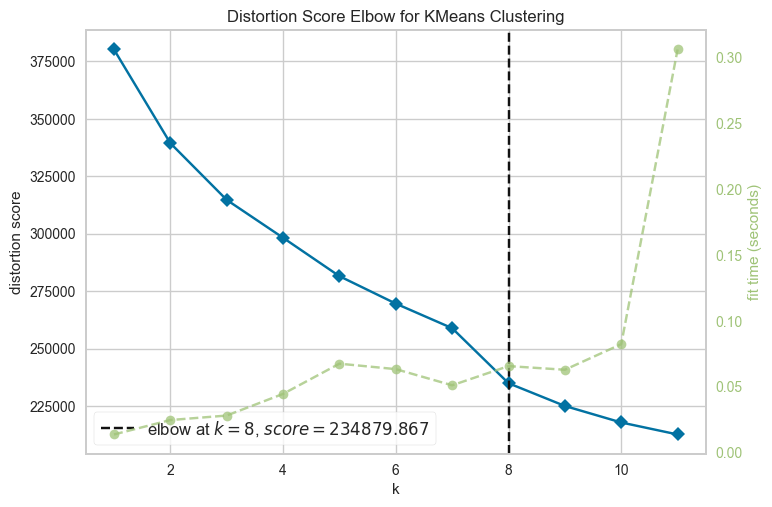

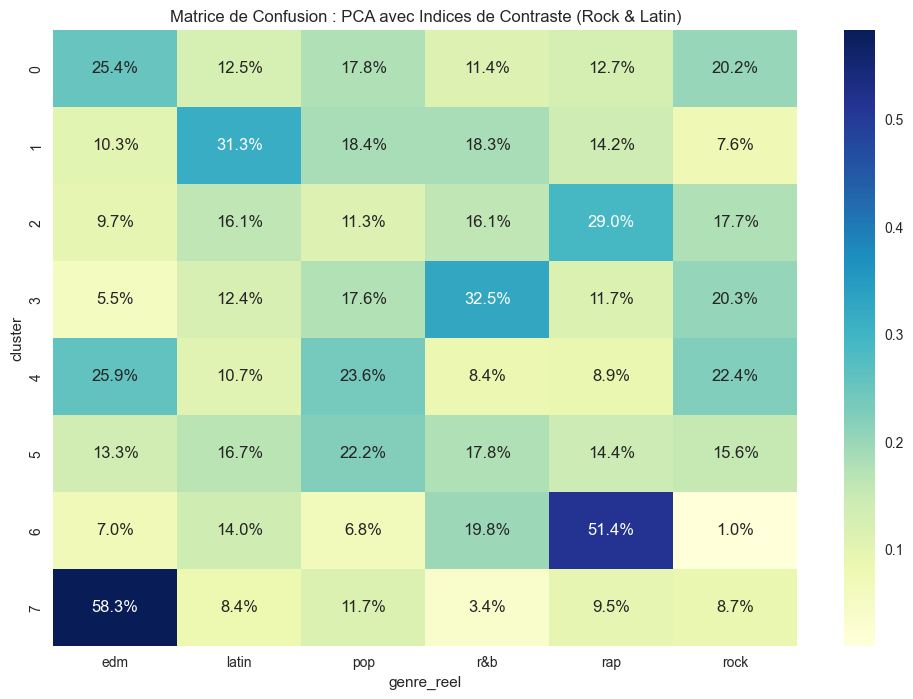

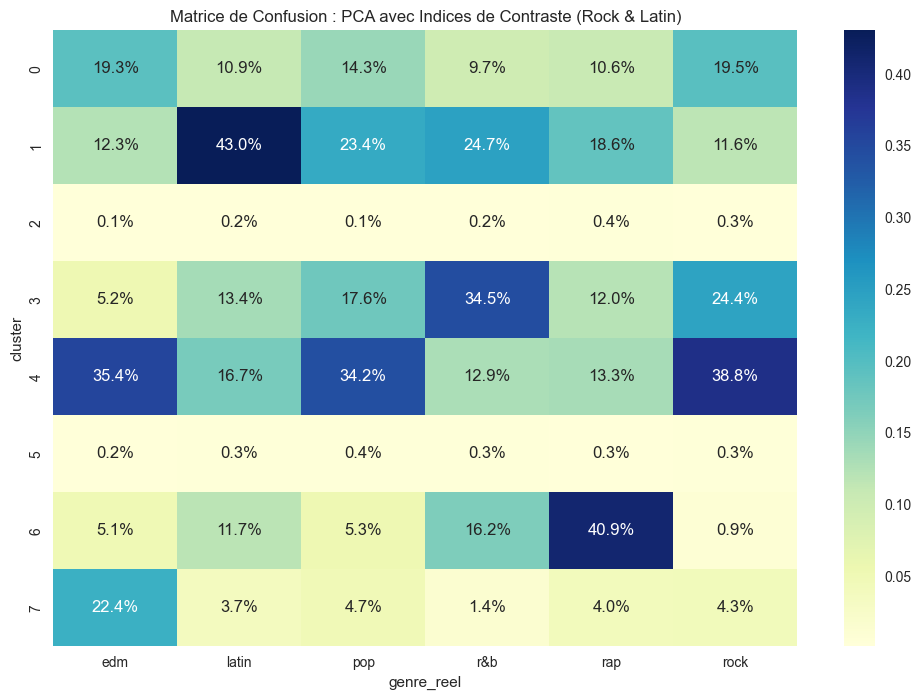

In [60]:
# 1. Préparation de df_boost
df_boost = df_clean.select_dtypes(include=[np.number]).copy()

# --- AJOUT DES INDICES DE CONTRASTE ---

# Indice "Organic-Rock" : Haute énergie mais faible acousticité (guitares électriques)
# On ajoute +0.01 pour éviter la division par zéro
df_boost['ind_rock_power'] = df_boost['energy'] / (df_boost['acousticness'] + 0.01)

# Indice "Groove-Latin" : Combo Danse + Joie (Valence)
df_boost['ind_latin_groove'] = df_boost['danceability'] * df_boost['valence']

# --- AJOUT DES INVERSES (Pour étirer le centre) ---
df_boost['inv_dance'] = 1 / (df_boost['danceability'] + 0.01)
df_boost['inv_energy'] = 1 / (df_boost['energy'] + 0.01)
print(df_boost.columns)
#df_boost =df_boost.drop(columns={"track_popularity","duration_ms"})
# 2. Scaling (Standardisation)
# On scale tout, y compris nos nouveaux indices pour qu'ils aient le même poids
scaler = StandardScaler()
df_boost[df_boost.columns] = scaler.fit_transform(df_boost)

# 3. PCA
pca = PCA(n_components=0.80, random_state=42)
pca_coords = pca.fit_transform(df_boost)

kmeans = KMeans(init='k-means++', n_init='auto', max_iter=100, random_state=42)
visualizer = KElbowVisualizer(kmeans, k=(1,12), force_model=True)
visualizer.fit(pca_coords)    # Fit the data to the visualizer
visualizer.show()    # Finalize and render the figure

# 4. K-means (K=6)
kmeans = KMeans(n_clusters=8, n_init=10, random_state=42)
df_boost['cluster'] = kmeans.fit_predict(pca_coords)
df_boost['genre_reel'] = df_clean['playlist_genre'].values

# 5. Affichage de la Matrice de Confusion
contingency = pd.crosstab(df_boost['cluster'], df_boost['genre_reel'], normalize='index')
plt.figure(figsize=(12, 8))
sns.heatmap(contingency, annot=True, fmt=".1%", cmap="YlGnBu")
plt.title("Matrice de Confusion : PCA avec Indices de Contraste (Rock & Latin)")
plt.show()

# 5. Affichage de la Matrice de Confusion
contingency = pd.crosstab(df_boost['cluster'], df_boost['genre_reel'], normalize='columns')
plt.figure(figsize=(12, 8))
sns.heatmap(contingency, annot=True, fmt=".1%", cmap="YlGnBu")
plt.title("Matrice de Confusion : PCA avec Indices de Contraste (Rock & Latin)")
plt.show()

